In [84]:
import numpy as np
from pathlib import Path
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import signal, optimize

clist = sns.color_palette('deep', n_colors=10)
sns.set_theme(context='talk', style='whitegrid', font_scale=1.25)

file_repo = Path.home()/'iCloud'/'penn_state_synca_data'/'dig'/'synca1_5slot_scan'
file_name = '230102_synca1_5slot_scan_fft_corrected_phases.npy'

def PhaseModel(coordinates, roll=0):

    ant_angles = np.arange(0, 120, 1) * 3
    r_array = 0.1
    wavelength = 3e8 / 25.86e9

    x_array = r_array * np.cos(np.radians(ant_angles))
    y_array = r_array * np.sin(np.radians(ant_angles))
    x_coord, y_coord = coordinates[:, 0], coordinates[:, 1]

    d = np.sqrt(
        (x_array[:, np.newaxis] - x_coord[np.newaxis, :]) ** 2
        + (y_array[:, np.newaxis] - y_coord[np.newaxis, :]) ** 2
        )
    arctan = np.arctan2(
        y_array[:, np.newaxis] - y_coord[np.newaxis, :],
        x_array[:, np.newaxis] - x_coord[np.newaxis, :]
        )

    spatial = 2*np.pi * d / wavelength
    phase = np.unwrap(np.roll(spatial+arctan, roll, axis=0), axis=0)
    phase -= phase[0, :][np.newaxis, :]
    
    return -phase

def phase_offset_correction(data_phases, model_phases, find_peak_height=0.5, find_peak_prom=0.3):
    
    phase_diff = data_phases-model_phases
    phase_diff = np.convolve(phase_diff, np.ones(5)/5, mode='valid')
    phase_diff_diff = np.convolve(np.diff(phase_diff), np.ones(5)/5, mode='same')
    peaks = signal.find_peaks(abs(phase_diff_diff), height=find_peak_height, prominence=find_peak_prom)
    #print(peaks)
    peak_inds = peaks[0]
    #print(peak_inds)
    peak_heights = peaks[1]['peak_heights']
    phase_correction = np.zeros(data_phases.size)
    n = 1
    for j in range(peak_inds.size):
        ind_j = peak_inds[j]
        if peak_inds.size == 1:
            approximate_discont_size = np.mean(phase_diff[ind_j+3:]) - np.mean(phase_diff[0:ind_j+3])
            n = np.round(approximate_discont_size/(2*np.pi), 0)
            phase_correction[ind_j+3:] += -1*2*n*np.pi
        elif peak_inds.size > 1:
            if j == 0: # first peak
                approximate_discont_size = np.mean(
                    phase_diff[ind_j+3:peak_inds[j+1]]+3) - np.mean(phase_diff[0:ind_j+3])
                n = np.round(approximate_discont_size/(2*np.pi), 0)
                #print(n)
                phase_correction[ind_j+3:] += -1*2*n*np.pi
            elif j == peak_inds.size - 1: # last peak
                approximate_discont_size = np.mean(
                    phase_diff[ind_j+3:]) - np.mean(phase_diff[peak_inds[j-1]+3:ind_j+3])
                n = np.round(approximate_discont_size/(2*np.pi), 0)
                #print(n)
                phase_correction[ind_j+3:] += -1*2*n*np.pi
            else: # intermediate peaks
                approximate_discont_size = np.mean(
                    phase_diff[ind_j+3:peak_inds[j+1]+3]) - np.mean(phase_diff[peak_inds[j-1]+3:ind_j+3])
                n = np.round(approximate_discont_size/(2*np.pi), 0)
                phase_correction[ind_j+3:] += -1*2*n*np.pi

    return phase_correction          


data = np.load(file_repo/file_name)
phase_data = np.angle(data)

# visualize some phase data

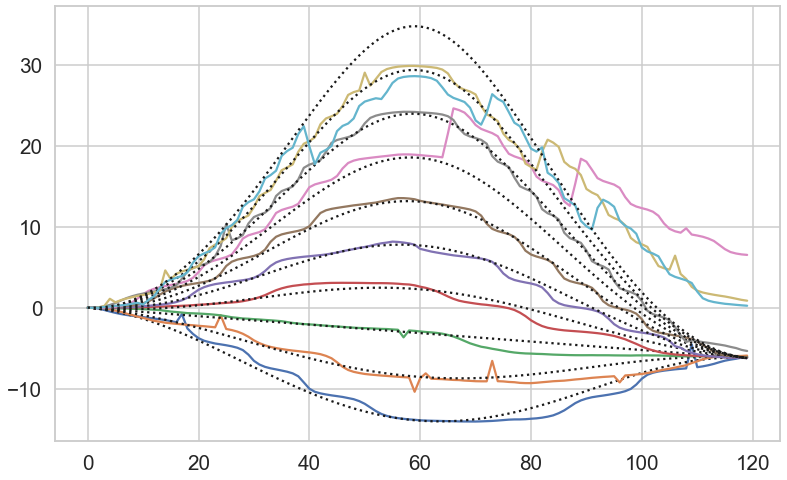

In [85]:
i_ax = 3
fig = plt.figure(figsize=(13,8))
ax = fig.add_subplot(1,1,1)

radii = np.arange(10, -40, -5) * 0.001

for i_rad in np.arange(0,10,1):
    i_phase = np.unwrap(phase_data[i_ax, i_rad, :])
    
    x_position = np.array([radii[i_rad]])
    y_position = np.array([0])
    coordinates = np.array([x_position, y_position]).T
    model_phases = PhaseModel(coordinates)
    
    ax.plot(i_phase)
    ax.plot(model_phases[:, 0], 'k:')

# compare phase errors from penn state to JUGAAD

In [86]:
jugaad_repo = Path.home()/'iCloud'/'jugaad_data'/'Characterization'
jugaad_data_name = '230113_phase_errors.npy'

In [87]:
jugaad_phase_differences = np.load(jugaad_repo/jugaad_data_name)
np.mean(jugaad_phase_differences)
print(jugaad_phase_differences.shape)

(6, 11, 141, 60)


3


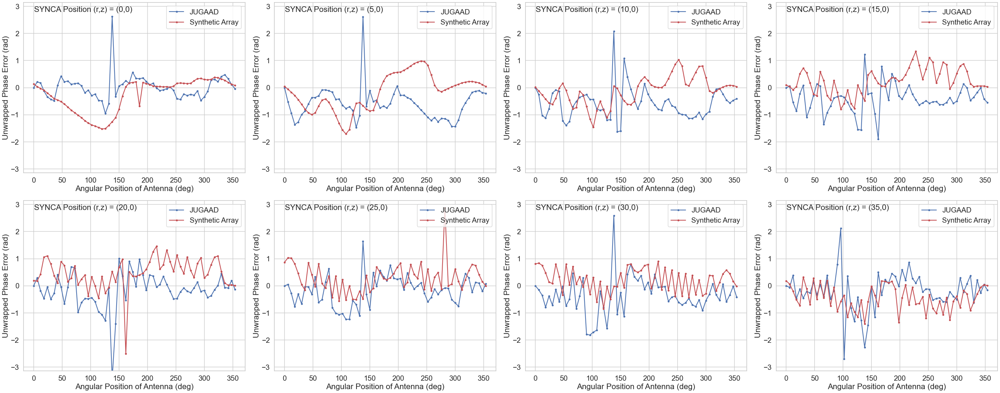

In [88]:
#i_ax_penn = 3
#i_ax_jugaad = 0

radii_penn = np.arange(10, -40, -5) * 0.001
i_axii_penn = [3]#np.arange(3, 9, 1) # 0 to 25 mm
axii = np.arange(0, 30, 5)
i_axii_jugaad = np.arange(0, 6, 1) # 0 to 25 mm

for m, i_ax_penn in enumerate(i_axii_penn):
    print(i_ax_penn)
    fig, axs = plt.subplots(2,4,sharex=False,sharey=False,figsize=(40,16))
    axs = axs.flatten()
    for n, i_rad_penn in enumerate(np.arange(2,10,1)):
        #axs.append(fig.add_subplot(2,4,n+1, sharex=True, sharey=True))

        i_phase = np.unwrap(phase_data[i_ax_penn, i_rad_penn, :])
        x_position = np.array([radii_penn[i_rad_penn]])
        y_position = np.array([0])
        coordinates = np.array([x_position, y_position]).T

        model_phases = PhaseModel(coordinates)[:, 0]
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_differences = i_phase - model_phases
        
        if abs(np.mean(phase_differences)) > 1.2:
            phase_differences -= np.mean(phase_differences)

        for k in [76]:#np.arange(0, jugaad_phase_differences.shape[2], 40):
            axs[n].plot(np.arange(0,360, 6),jugaad_phase_differences[m, n, k, :], color='b', ls='-', marker='.', label='JUGAAD')
            #ax2.plot(np.arange(0, 360, 6), np.sqrt(np.gradient(jugaad_phase_differences[m, n, k, :])**2), color='b', ls='-', marker='.')


        axs[n].plot(np.arange(0, 360, 6), np.flip(phase_differences)[np.arange(0, 120, 2)], color='r', marker='.', ls='-', label='Synthetic Array')
        #axs[n].hlines(np.mean(phase_differences), 0, 360, color='orange')
        #ax2.plot(np.arange(0, 360, 6), np.sqrt(np.gradient(np.flip(phase_differences[np.arange(0, 120, 2)]))**2), color='r', marker='.', ls='-')
        
        axs[n].set_ylim(-np.pi, np.pi)
        axs[n].set_ylabel('Unwrapped Phase Error (rad)')
        axs[n].set_xlabel('Angular Position of Antenna (deg)')
        axs[n].legend(loc=1)
        axs[n].text(0.5,2.8, f'SYNCA Position (r,z) = ({abs(int(radii_penn[i_rad_penn]*1000))},{axii[m]})')
    plt.tight_layout(pad=1.05)
    #plt.savefig(Path.home()/'iCloud'/'plots'/f'230117_phase_error_pair_comparison_z{axii[m]}', dpi=128)
    plt.show()
    

# fit a polynomial to the phase data, find outliers, remove outliers, save cleaned data

In [89]:
def fit_function(x,a,b,c,d,e,f):
    return a + b*x + c*x**2 + d*x**3 + e*x**4 + f*x**5

In [90]:
cleaned_jugaad_phase_errors = np.zeros((6,8,141,60))
cleaned_synth_phase_errors = np.zeros((6,8,120))

3


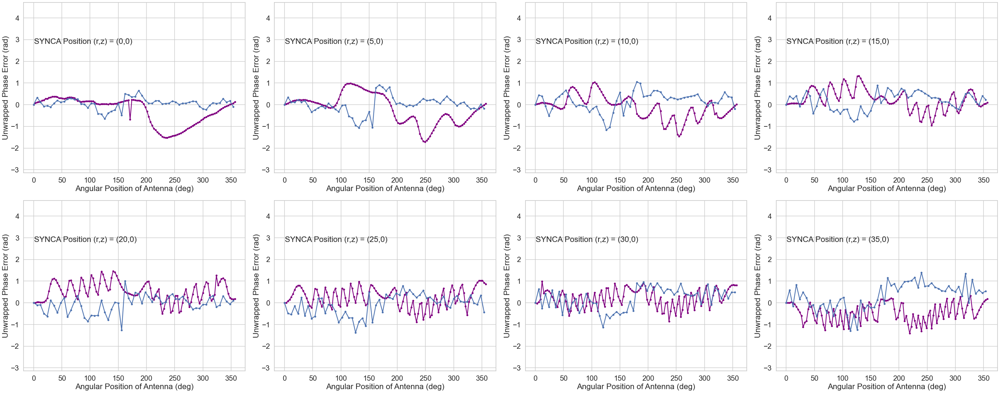

4


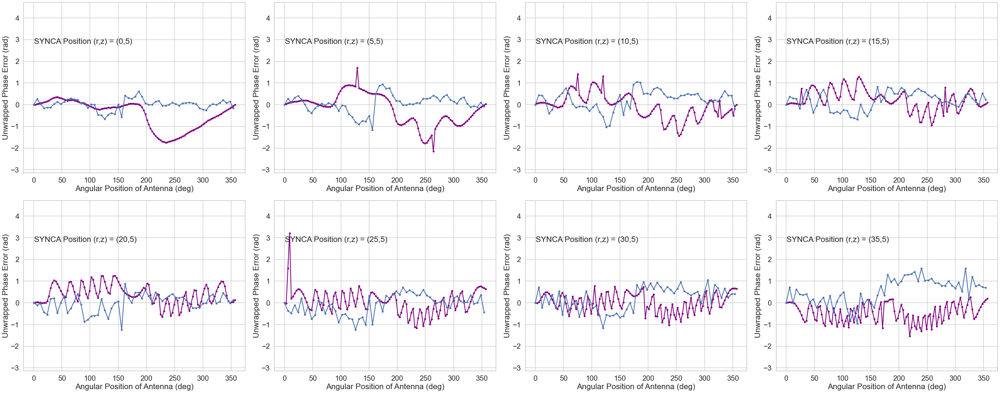

5


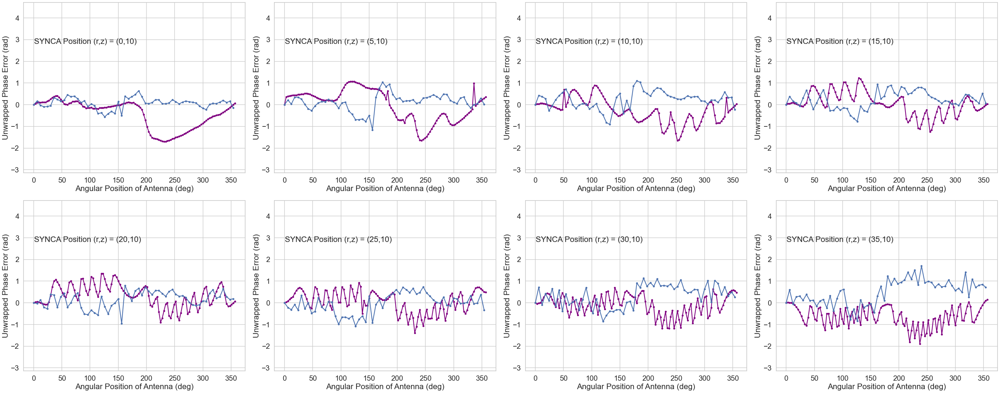

6


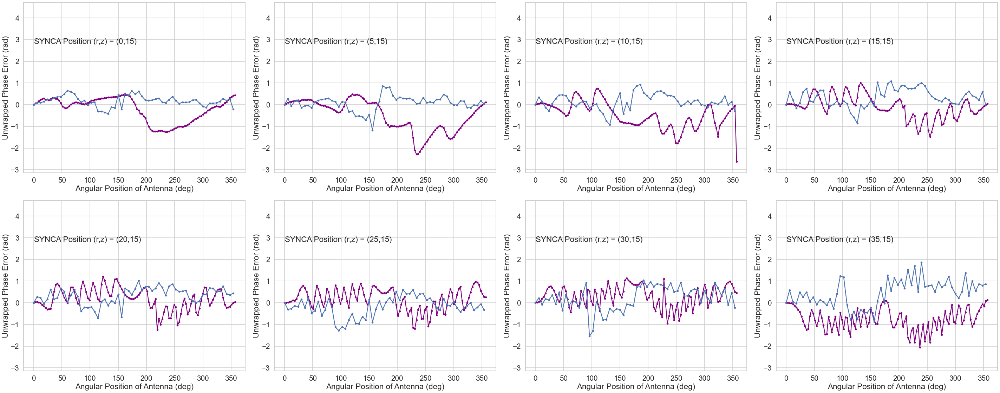

7


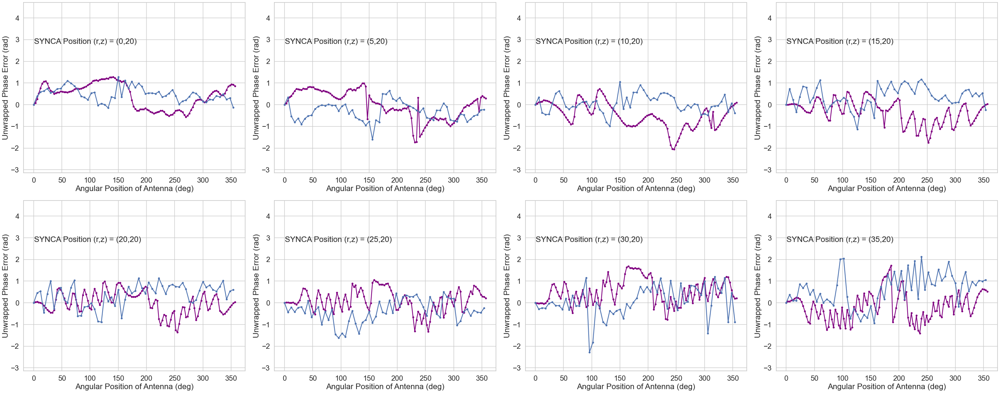

8


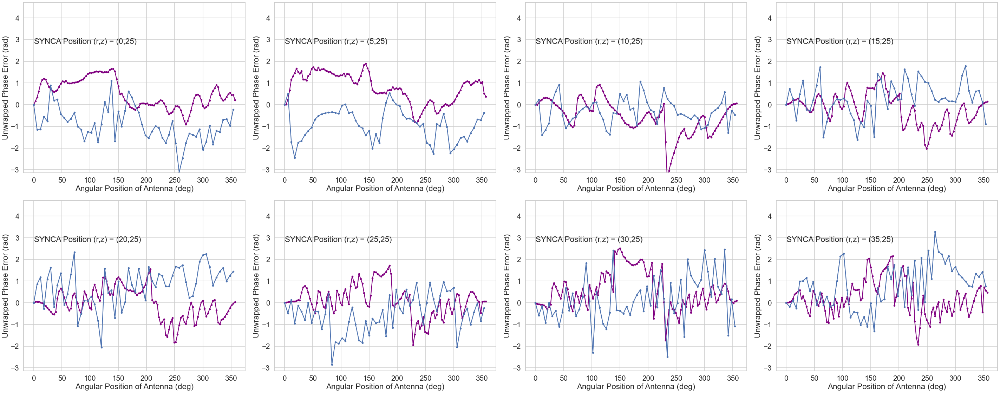

In [91]:
#i_ax_penn = 3
#i_ax_jugaad = 0

radii_penn = np.arange(10, -40, -5) * 0.001
i_axii_penn = [3,4,5,6,7,8]#np.arange(3, 9, 1) # 0 to 25 mm
axii = np.arange(0, 30, 5)
i_axii_jugaad = np.arange(0, 6, 1) # 0 to 25 mm

for m, i_ax_penn in enumerate(i_axii_penn):
    print(i_ax_penn)
    fig, axs = plt.subplots(2,4,sharex=False,sharey=False,figsize=(40,16))
    axs = axs.flatten()
    for n, i_rad_penn in enumerate(np.arange(2,10,1)):
        #axs.append(fig.add_subplot(2,4,n+1, sharex=True, sharey=True))

        i_phase = np.unwrap(phase_data[i_ax_penn, i_rad_penn, :])
        x_position = np.array([radii_penn[i_rad_penn]])
        y_position = np.array([0])
        coordinates = np.array([x_position, y_position]).T

        model_phases = PhaseModel(coordinates)[:, 0]
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_differences = i_phase - model_phases
        phase_differences = phase_differences[np.arange(0, 120, 1)]
        if m == 1 and n == 0:
            phase_differences[1:] -= phase_differences[1]
        elif m == 1 and n == 5:
            phase_differences[2:] += 2*np.pi
        elif m == 5 and n == 2:
            phase_differences[1:] -= phase_differences[1]
        
        popt,pcov = optimize.curve_fit(fit_function, np.arange(0,360,3),phase_differences)
        #if abs(np.mean(phase_differences)) > 1.2:
        #    phase_differences -= np.mean(phase_differences)
        
        abs_diff_from_fit = abs(fit_function(np.arange(0,360,3),*popt) - phase_differences)
        #axs[n].plot(np.arange(0, 360, 6), phase_differences, color='r', marker='.', ls='-', label='Synthetic Array')
        #axs[n].plot(np.arange(0,360,6),fit_function(np.arange(0,360,6),*popt), color='b',marker='.', ls='-')
        #axs[n].plot(np.arange(0,360,6),abs_diff_from_fit,color='orange',marker='.')
        peaks, peak_params = signal.find_peaks(
            abs_diff_from_fit,
            prominence=0.8,
            threshold=0.3,
            height=1.,
        )
        phase_diff_outliers_removed = np.copy(phase_differences)
        for i_peak in peaks:
            phase_diff_outliers_removed[i_peak] = phase_differences[[i_peak-1,i_peak+1]].mean()
            
        cleaned_synth_phase_errors[m,n:] = phase_diff_outliers_removed
        #axs[n].plot(np.arange(0,360,6)[peaks],abs_diff_from_fit[peaks], color='g',marker='.',ls='None',markersize=20)
        axs[n].plot(np.arange(0,360,3),phase_diff_outliers_removed,color='purple',marker='.',ls='-')
        for i_freq in range(141):
            
            jugaad_diff = jugaad_phase_differences[m, n, i_freq, :]
            #jugaad_diff = jugaad_phase_differences[m,n,:,:].mean(axis=0)
            popt,pcov = optimize.curve_fit(fit_function, np.arange(0,360,6),jugaad_diff)
            abs_diff_from_fit = abs(fit_function(np.arange(0,360,6),*popt)-jugaad_diff)
            peaks, peak_params = signal.find_peaks(
                abs_diff_from_fit,
                prominence=0.8,
                threshold=0.3,
                height=np.max(abs_diff_from_fit)*0.8,
            )
            jugaad_diff_outliers_removed = np.copy(jugaad_diff)
            for i_peak in peaks:
                jugaad_diff_outliers_removed[i_peak] = jugaad_diff[[i_peak-2,i_peak-1,i_peak+1,i_peak+2]].mean()
            cleaned_jugaad_phase_errors[m,n,i_freq,:] = jugaad_diff_outliers_removed
        #axs[n].plot(np.arange(0,360, 6),jugaad_diff, color='b', ls='-', marker='.', label='JUGAAD')
        #axs[n].plot(np.arange(0,360,6),fit_function(np.arange(0,360,6),*popt),color='r')
        #axs[n].plot(np.arange(0,360,6),abs_diff_from_fit,color='orange')
        #axs[n].plot(np.arange(0,360,6)[peaks],abs_diff_from_fit[peaks], color='r',marker='.',ls='None',markersize=15)
        
        axs[n].plot(np.arange(0,360,6),jugaad_diff_outliers_removed,color='b',marker='.',ls='-')
        
        #axs[n].hlines(np.mean(phase_differences), 0, 360, color='orange')
        #ax2.plot(np.arange(0, 360, 6), np.sqrt(np.gradient(np.flip(phase_differences[np.arange(0, 120, 2)]))**2), color='r', marker='.', ls='-')
        
        axs[n].set_ylim(-np.pi, 1.5*np.pi)
        axs[n].set_ylabel('Unwrapped Phase Error (rad)')
        axs[n].set_xlabel('Angular Position of Antenna (deg)')
        #axs[n].legend(loc=1)
        axs[n].text(0.5,2.8, f'SYNCA Position (r,z) = ({abs(int(radii_penn[i_rad_penn]*1000))},{axii[m]})')
    plt.tight_layout(pad=1.05)
    #plt.savefig(Path.home()/'iCloud'/'plots'/f'230117_phase_error_pair_comparison_z{axii[m]}', dpi=128)
    plt.show()
    

# save cleaned errors

In [92]:
np.save(
    Path.home()/'iCloud'/'jugaad_data'/'Characterization'/'230119_cleaned_phase_errors_single_freq.npy',
    cleaned_jugaad_phase_errors,
)
np.save(
    Path.home()/'iCloud'/'penn_state_synca_data'/'dig'/'synca1_5slot_scan'/'230119_cleaned_phase_errors.npy',
    cleaned_synth_phase_errors
)

# Frequency spectra of phase errors

3


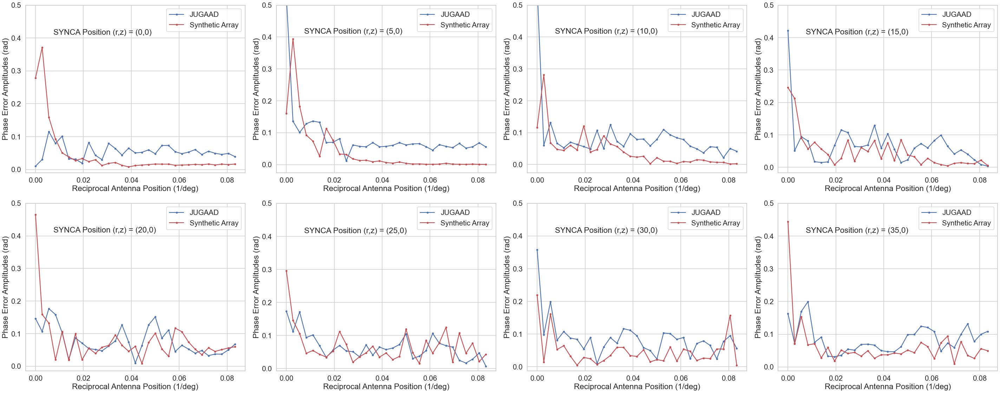

4


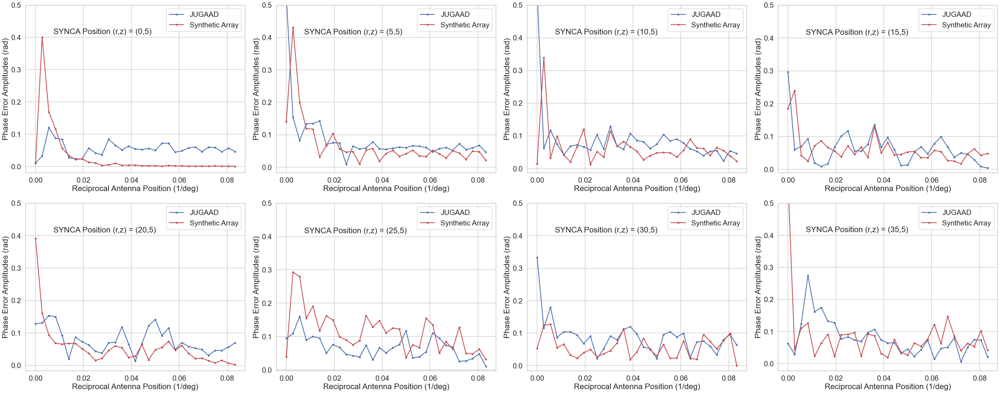

5


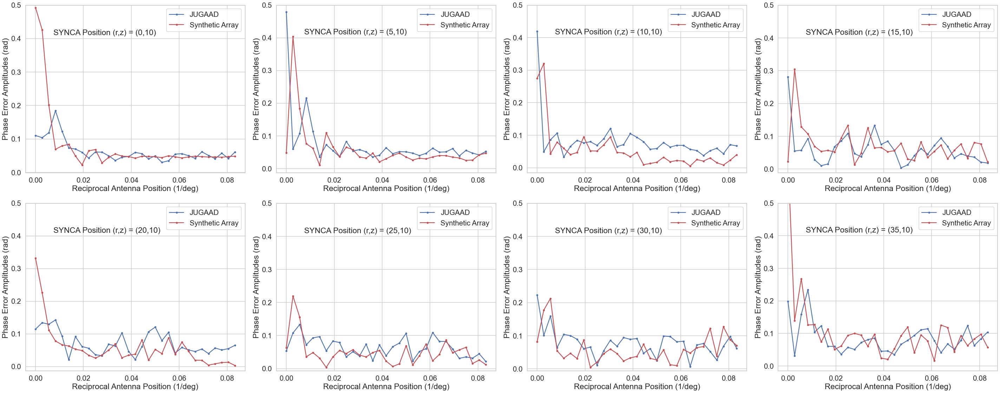

6


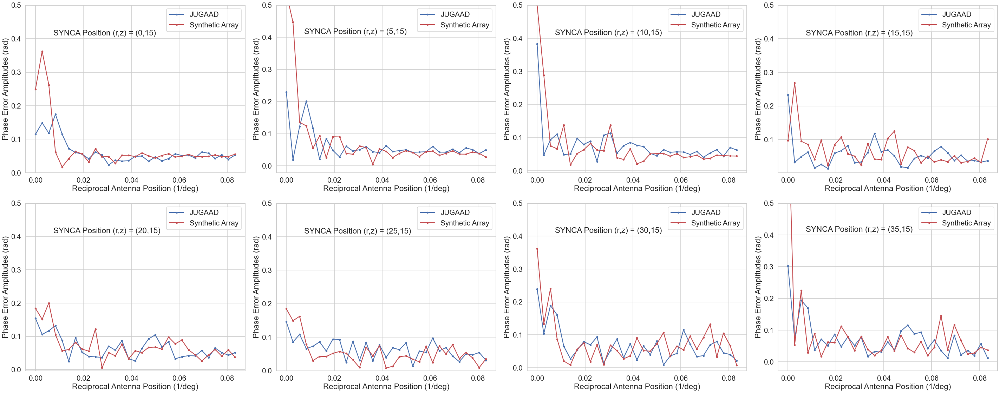

7


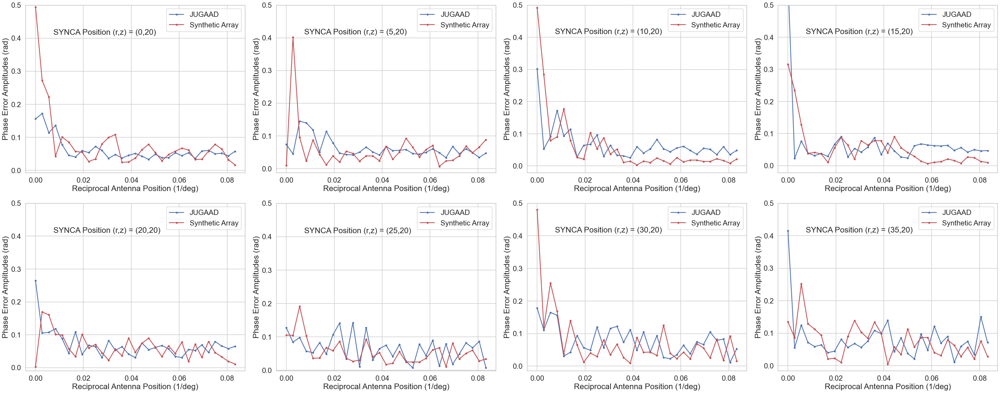

8


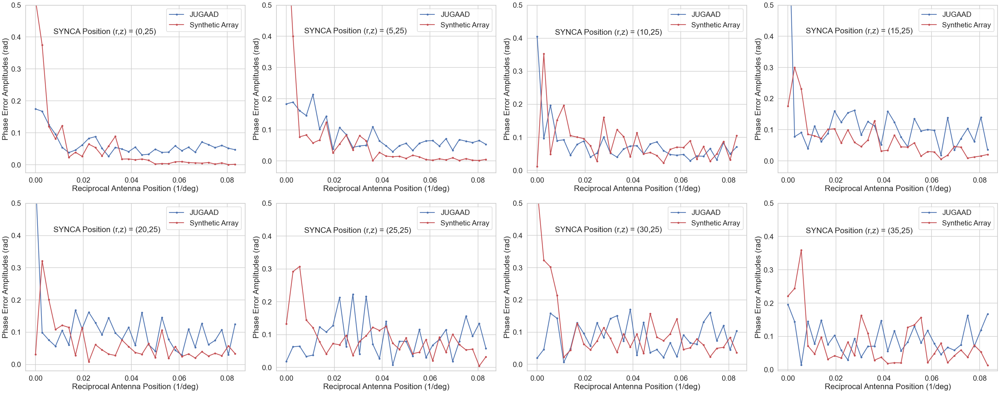

In [281]:
#i_ax_penn = 3
#i_ax_jugaad = 0

radii_penn = np.arange(10, -40, -5) * 0.001
i_axii_penn = np.arange(3, 9, 1) # 0 to 25 mm
axii = np.arange(0, 30, 5)
i_axii_jugaad = np.arange(0, 6, 1) # 0 to 25 mm

for m, i_ax_penn in enumerate(i_axii_penn):
    print(i_ax_penn)
    fig, axs = plt.subplots(2,4,sharex=False,sharey=False,figsize=(40,16))
    axs = axs.flatten()
    for n, i_rad_penn in enumerate(np.arange(2,10,1)):
        #axs.append(fig.add_subplot(2,4,n+1, sharex=True, sharey=True))

        i_phase = np.unwrap(phase_data[i_ax_penn, i_rad_penn, :])
        x_position = np.array([radii_penn[i_rad_penn]])
        y_position = np.array([0])
        coordinates = np.array([x_position, y_position]).T

        model_phases = PhaseModel(coordinates)[:, 0]
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_differences = i_phase - model_phases
        
        if abs(np.mean(phase_differences)) > 1.2:
            phase_differences -= np.mean(phase_differences)
            
        freq = np.fft.rfftfreq(60, 6)
        #print(jugaad_phase_differences[m, n, k, :].size, freq.size)
        #print(np.fft.rfft(jugaad_phase_differences[m, n, k, :], norm='forward').size)
        for k in [76]:#np.arange(0, jugaad_phase_differences.shape[2], 40):
            axs[n].plot(freq, abs(np.fft.rfft(jugaad_phase_differences[m, n, k, :], norm='forward')), color='b', ls='-', marker='.', label='JUGAAD')
            #ax2.plot(np.arange(0, 360, 6), np.sqrt(np.gradient(jugaad_phase_differences[m, n, k, :])**2), color='b', ls='-', marker='.')


        axs[n].plot(freq, abs(np.fft.rfft(np.flip(phase_differences)[np.arange(0, 120, 2)], norm='forward')), color='r', marker='.', ls='-', label='Synthetic Array')
        #axs[n].hlines(np.mean(phase_differences), 0, 360, color='orange')
        #ax2.plot(np.arange(0, 360, 6), np.sqrt(np.gradient(np.flip(phase_differences[np.arange(0, 120, 2)]))**2), color='r', marker='.', ls='-')
        
        ylims = axs[n].get_ylim()
        axs[n].set_ylim(ylims[0], 0.5)
        axs[n].set_ylabel('Phase Error Amplitudes (rad)')
        axs[n].set_xlabel('Reciprocal Antenna Position (1/deg)')
        axs[n].legend(loc=1)
        axs[n].text(0.0075,0.41, f'SYNCA Position (r,z) = ({abs(int(radii_penn[i_rad_penn]*1000))},{axii[m]})')
    plt.tight_layout(pad=1.05)
    plt.savefig(Path.home()/'iCloud'/'plots'/f'230117_phase_error_pair_comparison_z{axii[m]}_spectra', dpi=128)
    plt.show()
    

# Mean Phase Error amplitude as a function of synca position

3
4
5
6
7
8


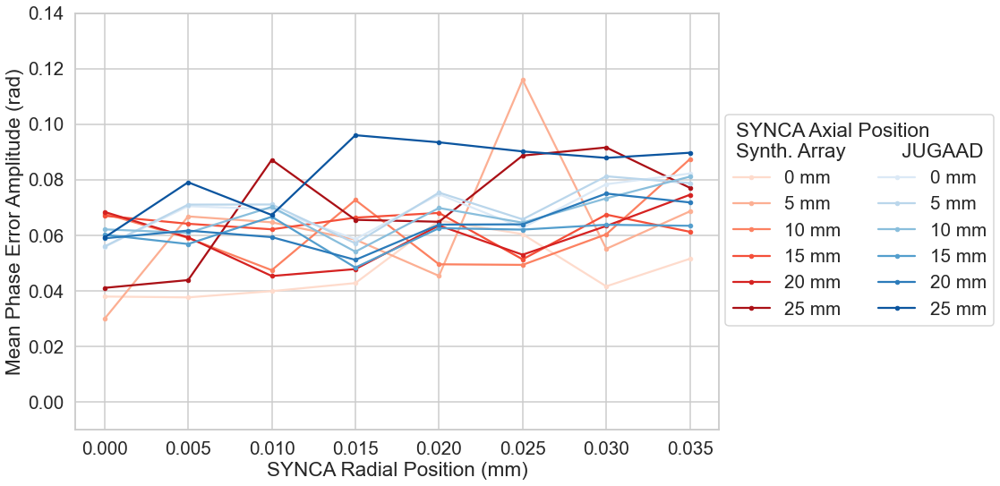

In [313]:
#i_ax_penn = 3
#i_ax_jugaad = 0

radii_penn = np.arange(10, -40, -5) * 0.001
i_axii_penn = np.arange(3, 9, 1) # 0 to 25 mm
axii = np.arange(0, 30, 5)
i_axii_jugaad = np.arange(0, 6, 1) # 0 to 25 mm

mean_phase_error_amplitude_penn = np.zeros((axii.size, 8))
mean_phase_error_amplitude_jugaad = np.zeros((axii.size, 8))


for m, i_ax_penn in enumerate(i_axii_penn):
    print(i_ax_penn)
    for n, i_rad_penn in enumerate(np.arange(2,10,1)):
        #axs.append(fig.add_subplot(2,4,n+1, sharex=True, sharey=True))

        i_phase = np.unwrap(phase_data[i_ax_penn, i_rad_penn, :])
        x_position = np.array([radii_penn[i_rad_penn]])
        y_position = np.array([0])
        coordinates = np.array([x_position, y_position]).T

        model_phases = PhaseModel(coordinates)[:, 0]
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_differences = i_phase - model_phases
        
        if abs(np.mean(phase_differences)) > 1.2:
            phase_differences -= np.mean(phase_differences)
        mean_phase_error_amplitude_jugaad[m,n] = np.mean(
            abs(np.fft.rfft(jugaad_phase_differences[m, n, 76, :], norm='forward'))[1:]
        )
        mean_phase_error_amplitude_penn[m,n] = np.mean(
            abs(np.fft.rfft(np.flip(phase_differences)[np.arange(0, 120, 2)], norm='forward'))[1:]
        )
        freq = np.fft.rfftfreq(60, 6)
        #print(jugaad_phase_differences[m, n, k, :].size, freq.size)
        #print(np.fft.rfft(jugaad_phase_differences[m, n, k, :], norm='forward').size)
        #for k in [76]:#np.arange(0, jugaad_phase_differences.shape[2], 40):
        #    axs[n].plot(freq, abs(np.fft.rfft(jugaad_phase_differences[m, n, k, :], norm='forward')), color='b', ls='-', marker='.', label='JUGAAD')
            #ax2.plot(np.arange(0, 360, 6), np.sqrt(np.gradient(jugaad_phase_differences[m, n, k, :])**2), color='b', ls='-', marker='.')


        #axs[n].plot(freq, abs(np.fft.rfft(np.flip(phase_differences)[np.arange(0, 120, 2)], norm='forward')), color='r', marker='.', ls='-', label='Synthetic Array')
        #axs[n].hlines(np.mean(phase_differences), 0, 360, color='orange')
        #ax2.plot(np.arange(0, 360, 6), np.sqrt(np.gradient(np.flip(phase_differences[np.arange(0, 120, 2)]))**2), color='r', marker='.', ls='-')

clist_penn = sns.color_palette('Reds', n_colors=6)
clist_jugaad = sns.color_palette('Blues', n_colors=6)
ls_list = ['-', ]
fig, axs = plt.subplots(1,1,sharex=False,sharey=False,figsize=(16,8))
for m,i_ax_penn in enumerate(i_axii_penn):
    axs.plot(abs(radii_penn[np.arange(2,10,1)]), mean_phase_error_amplitude_penn[m,:],color=clist_penn[m],ls='-',marker='.',label=f'{axii[m]} mm')
for m,i_ax_penn in enumerate(i_axii_penn):
    axs.plot(abs(radii_penn[np.arange(2,10,1)]), mean_phase_error_amplitude_jugaad[m,:],color=clist_jugaad[m],ls='-',marker='.',label=f'{axii[m]} mm')

    #ylims = axs.get_ylim()
axs.set_ylim(-0.01, 0.14)


    #ylims = axs[n].get_ylim()
    #axs[n].set_ylim(ylims[0], 0.5)
axs.set_ylabel('Mean Phase Error Amplitude (rad)')
axs.set_xlabel('SYNCA Radial Position (mm)')
axs.legend(title='SYNCA Axial Position'+'\n'+'Synth. Array'+'          '+'JUGAAD',loc=(1.01, 0.25),ncol=2)
    #axs[n].legend(loc=1)
    #axs[n].text(0.0075,0.41, f'SYNCA Position (r,z) = ({abs(int(radii_penn[i_rad_penn]*1000))},{axii[m]})')
plt.tight_layout(pad=1.05)
    #plt.savefig(Path.home()/'iCloud'/'plots'/f'230117_phase_error_pair_comparison_z{axii[m]}_spectra', dpi=128)
plt.savefig(Path.home()/'iCloud'/'plots'/'230117_mean_phase_error_amplitude_radial_sweep_compare')
    
    

# try to remove outliers from the phase error plots

In [ ]:
# outlier dictionaries
jugaad_outliers = {
    0:{0:[23],5:[23],10:[23],15:[23],20:[23],25:[23],30:[23],35:[23]},
    5:{0:[23],5:[23],10:[23],15:[23],20:[23],25:[23],30:[23],35:[23]},
    10:{0:[23],5:[23],10:[23],15:[]}
}
synth_outliers = {
    0:{0:[31],5:[],10:[],15:[],20:[27],25:[47],30:[],35:[]},
    5:{0:[],5:[38,57],10:[46,51],15:[7,31],20:[],25:[58,59],30:[47],35:[1,42,56]},
    10:{0:[11],5:[39],10:{[3,51]}}
}

3


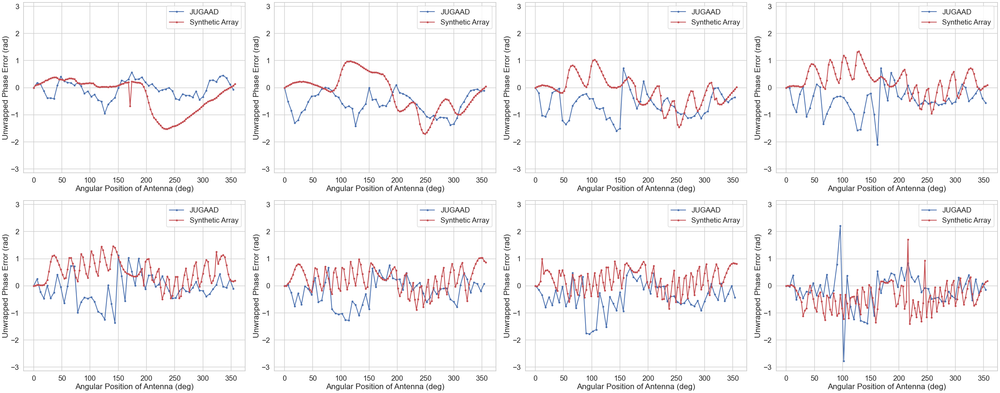

4


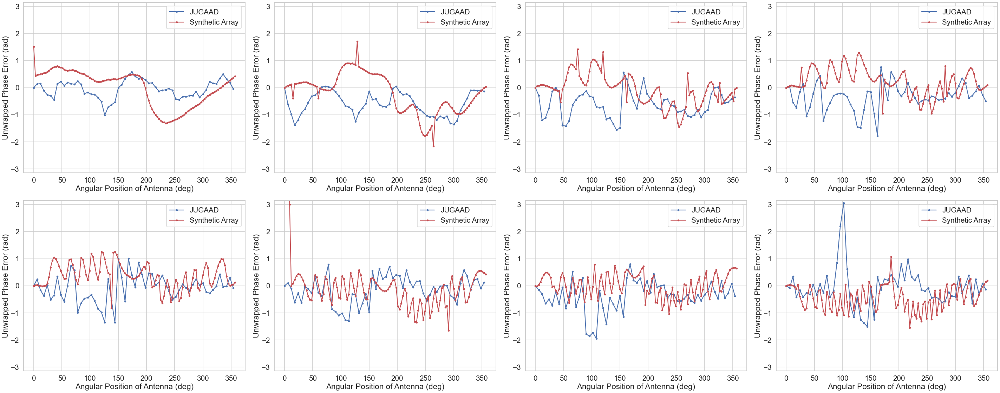

5


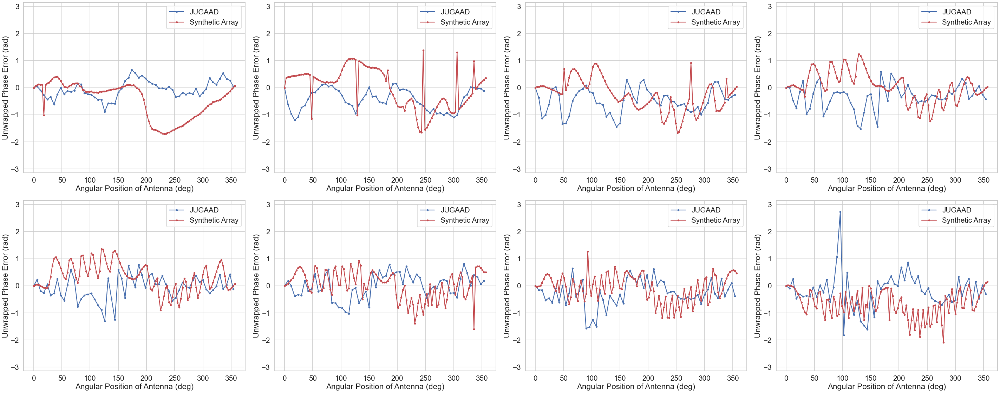

6


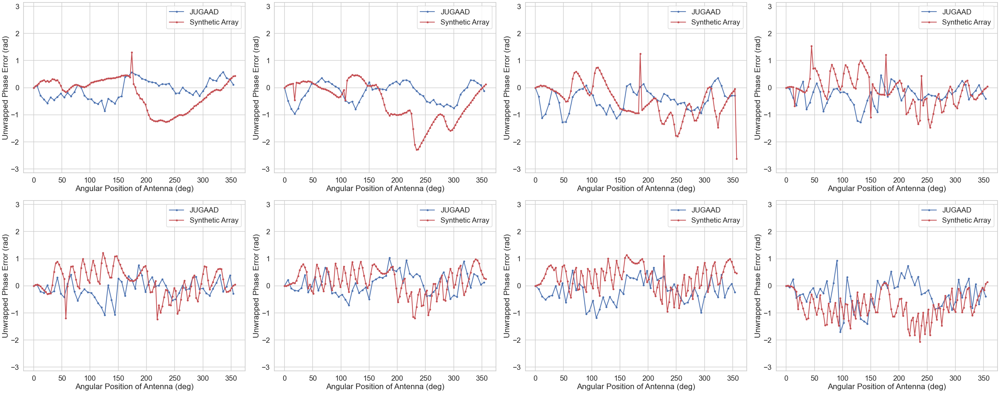

7


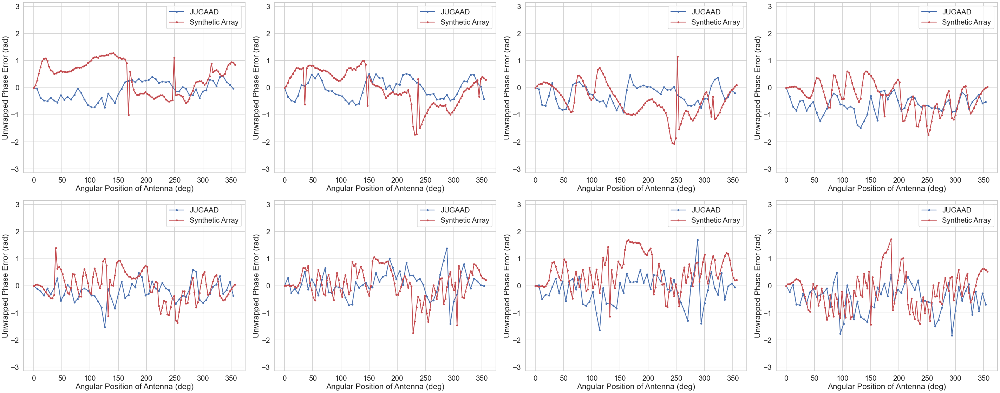

8


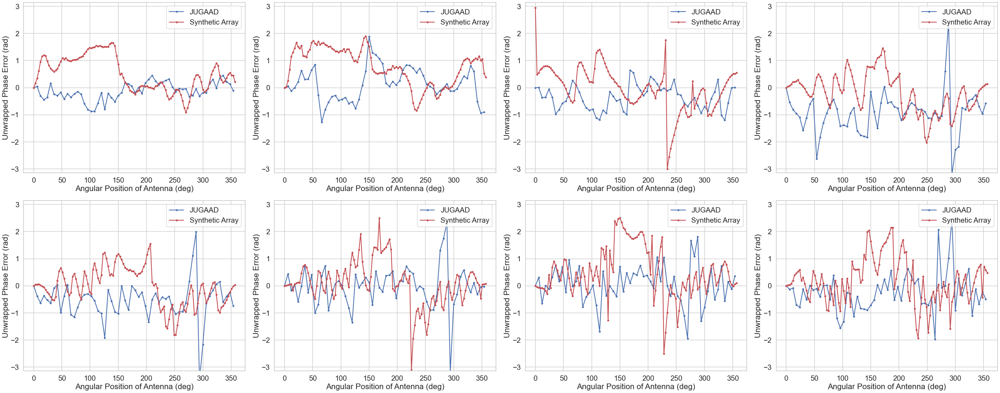

In [71]:
#i_ax_penn = 3
#i_ax_jugaad = 0

radii_penn = np.arange(10, -40, -5) * 0.001
i_axii_penn = np.arange(3, 9, 1) # 0 to 25 mm
axii = np.arange(0, 30, 5)
i_axii_jugaad = np.arange(0, 6, 1) # 0 to 25 mm

for m, i_ax_penn in enumerate(i_axii_penn):
    print(i_ax_penn)
    fig, axs = plt.subplots(2,4,sharex=False,sharey=False,figsize=(40,16))
    axs = axs.flatten()
    for n, i_rad_penn in enumerate(np.arange(2,10,1)):
        #axs.append(fig.add_subplot(2,4,n+1, sharex=True, sharey=True))

        i_phase = np.unwrap(phase_data[i_ax_penn, i_rad_penn, :])
        x_position = np.array([radii_penn[i_rad_penn]])
        y_position = np.array([0])
        coordinates = np.array([x_position, y_position]).T

        model_phases = PhaseModel(coordinates)[:, 0]
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_differences = i_phase - model_phases
        
        if abs(np.mean(phase_differences)) > 1.2:
            phase_differences -= np.mean(phase_differences)

        for k in [76]:#np.arange(0, jugaad_phase_differences.shape[2], 40):
            jugaad_phase_diff_curve = jugaad_phase_differences[m, n, k, :]
            jugaad_phase_diff_curve[23] = jugaad_phase_diff_curve[[22,24]].mean()
            axs[n].plot(np.arange(0,360, 6),jugaad_phase_diff_curve, color='b', ls='-', marker='.', label='JUGAAD')
            #ax2.plot(np.arange(0, 360, 6), np.sqrt(np.gradient(jugaad_phase_differences[m, n, k, :])**2), color='b', ls='-', marker='.')

        synth_phase_diff_curve = phase_differences[np.arange(0, 120, 1)]
        peak, peak_props = signal.find_peaks(abs(synth_phase_diff_curve), width=[0,2], threshold=1)
        #print(peak)
        for peak_ind in peak:
            synth_phase_diff_curve[peak] = synth_phase_diff_curve[[peak_ind-1, peak_ind+1]].mean()
            
            
        axs[n].plot(np.arange(0, 360, 3), synth_phase_diff_curve, color='r', marker='.', ls='-', label='Synthetic Array')
        #axs[n].hlines(np.mean(phase_differences), 0, 360, color='orange')
        #ax2.plot(np.arange(0, 360, 6), np.sqrt(np.gradient(np.flip(phase_differences[np.arange(0, 120, 2)]))**2), color='r', marker='.', ls='-')
        
        axs[n].set_ylim(-np.pi, np.pi)
        axs[n].set_ylabel('Unwrapped Phase Error (rad)')
        axs[n].set_xlabel('Angular Position of Antenna (deg)')
        axs[n].legend(loc=1)
        #axs[n].text(0.5,2.8, f'SYNCA Position (r,z) = ({abs(int(radii_penn[i_rad_penn]*1000))},{axii[m]})')
    plt.tight_layout(pad=1.05)
    #plt.savefig(Path.home()/'iCloud'/'plots'/f'230117_phase_error_pair_comparison_z{axii[m]}', dpi=128)
    plt.show()
    

# Frequency spectra of the phase error with some outliers removed

3


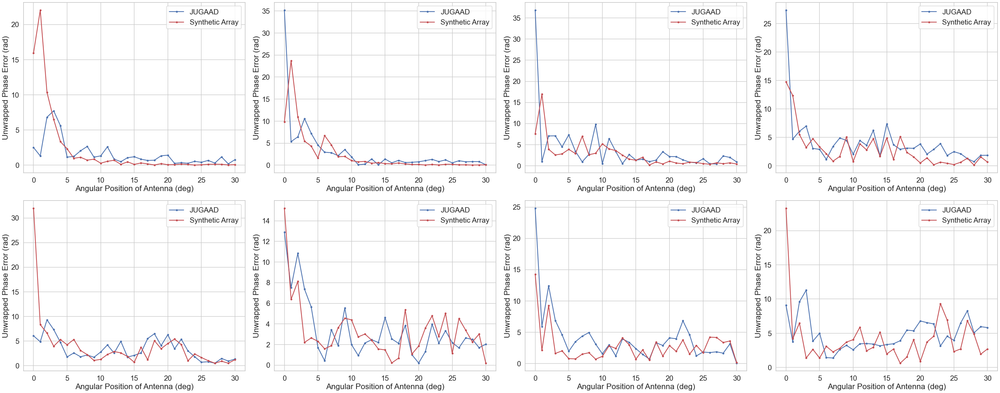

4


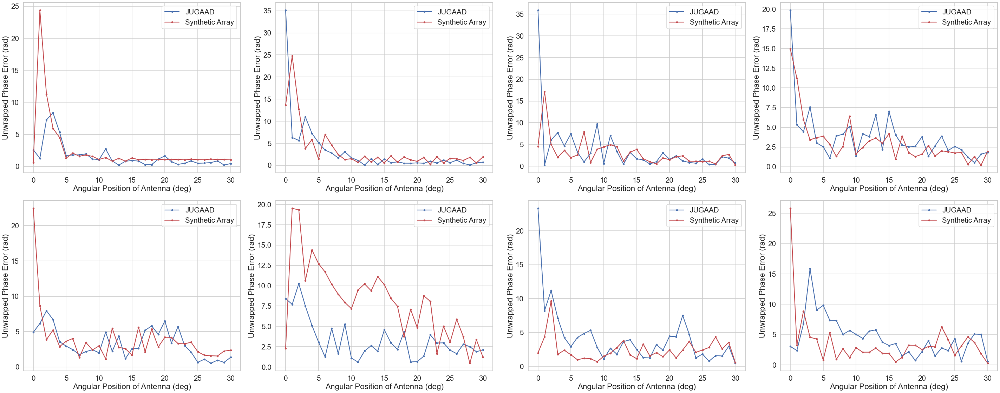

5


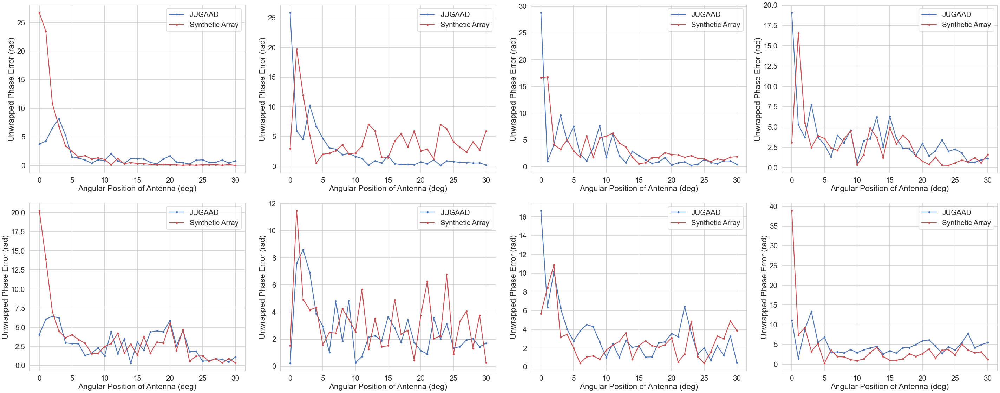

6


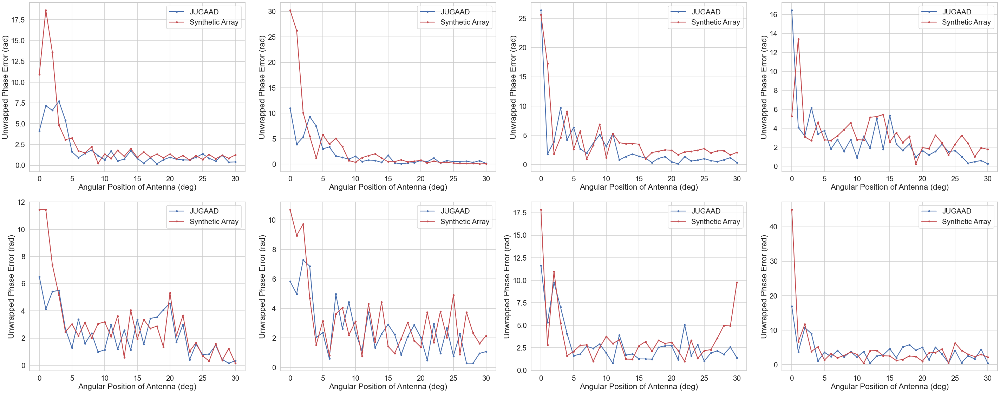

7


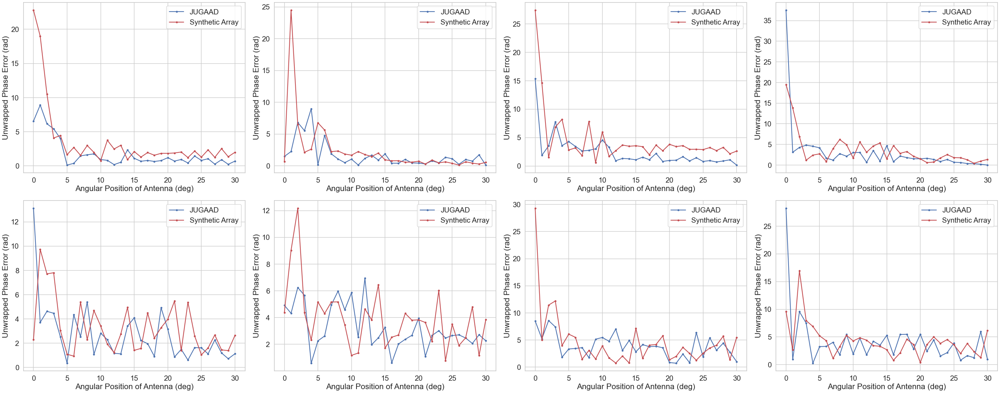

8


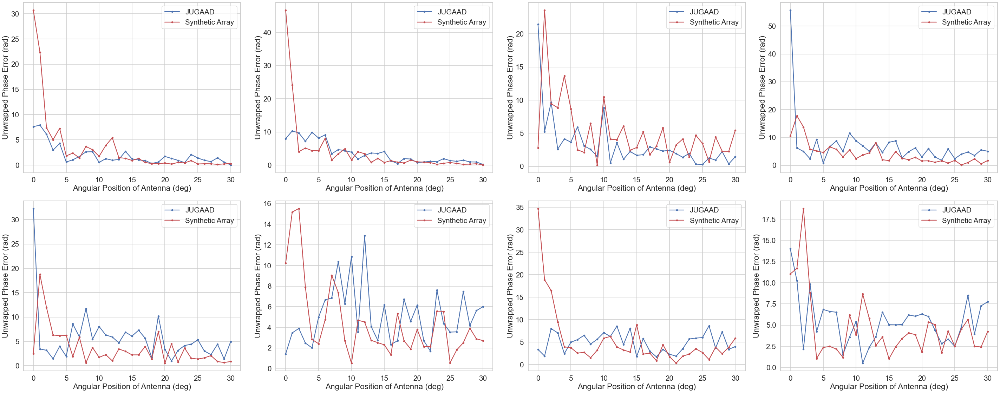

In [34]:
#i_ax_penn = 3
#i_ax_jugaad = 0

radii_penn = np.arange(10, -40, -5) * 0.001
i_axii_penn = np.arange(3, 9, 1) # 0 to 25 mm
axii = np.arange(0, 30, 5)
i_axii_jugaad = np.arange(0, 6, 1) # 0 to 25 mm

for m, i_ax_penn in enumerate(i_axii_penn):
    print(i_ax_penn)
    fig, axs = plt.subplots(2,4,sharex=False,sharey=False,figsize=(40,16))
    axs = axs.flatten()
    for n, i_rad_penn in enumerate(np.arange(2,10,1)):
        #axs.append(fig.add_subplot(2,4,n+1, sharex=True, sharey=True))

        i_phase = np.unwrap(phase_data[i_ax_penn, i_rad_penn, :])
        x_position = np.array([radii_penn[i_rad_penn]])
        y_position = np.array([0])
        coordinates = np.array([x_position, y_position]).T

        model_phases = PhaseModel(coordinates)[:, 0]
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_differences = i_phase - model_phases
        
        if abs(np.mean(phase_differences)) > 1.2:
            phase_differences -= np.mean(phase_differences)

        for k in [76]:#np.arange(0, jugaad_phase_differences.shape[2], 40):
            jugaad_phase_diff_curve = jugaad_phase_differences[m, n, k, :]
            jugaad_phase_diff_curve[23] = jugaad_phase_diff_curve[[22,24]].mean()
            axs[n].plot(abs(np.fft.rfft(jugaad_phase_diff_curve)), color='b', ls='-', marker='.', label='JUGAAD')
            #ax2.plot(np.arange(0, 360, 6), np.sqrt(np.gradient(jugaad_phase_differences[m, n, k, :])**2), color='b', ls='-', marker='.')

        synth_phase_diff_curve = phase_differences[np.arange(0, 120, 2)]
        peak, peak_props = signal.find_peaks(abs(synth_phase_diff_curve), width=[0,2], threshold=1)
        #print(peak)
        for peak_ind in peak:
            synth_phase_diff_curve[peak] = synth_phase_diff_curve[[peak_ind-1, peak_ind+1]].mean()
            
            
        axs[n].plot(abs(np.fft.rfft(synth_phase_diff_curve)), color='r', marker='.', ls='-', label='Synthetic Array')
        #axs[n].hlines(np.mean(phase_differences), 0, 360, color='orange')
        #ax2.plot(np.arange(0, 360, 6), np.sqrt(np.gradient(np.flip(phase_differences[np.arange(0, 120, 2)]))**2), color='r', marker='.', ls='-')
        
        #axs[n].set_ylim(-np.pi, np.pi)
        axs[n].set_ylabel('Unwrapped Phase Error (rad)')
        axs[n].set_xlabel('Angular Position of Antenna (deg)')
        axs[n].legend(loc=1)
        #axs[n].text(0.5,2.8, f'SYNCA Position (r,z) = ({abs(int(radii_penn[i_rad_penn]*1000))},{axii[m]})')
    plt.tight_layout(pad=1.05)
    #plt.savefig(Path.home()/'iCloud'/'plots'/f'230117_phase_error_pair_comparison_z{axii[m]}', dpi=128)
    plt.show()

# Frequency spectrum of phase errors

3


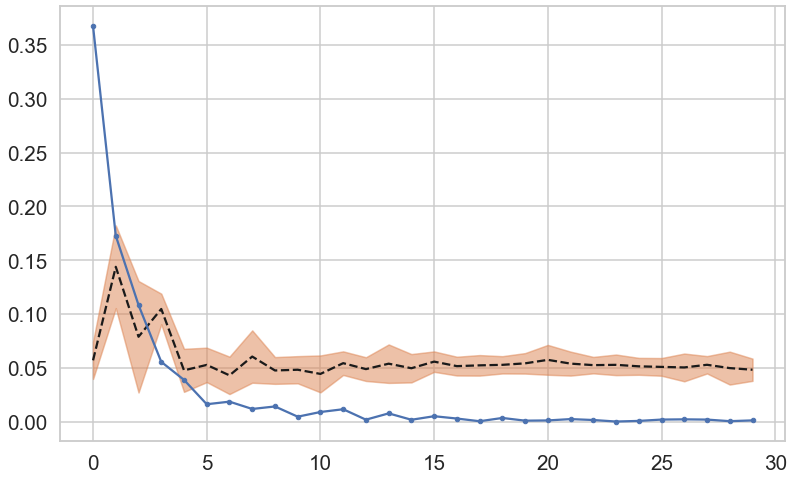

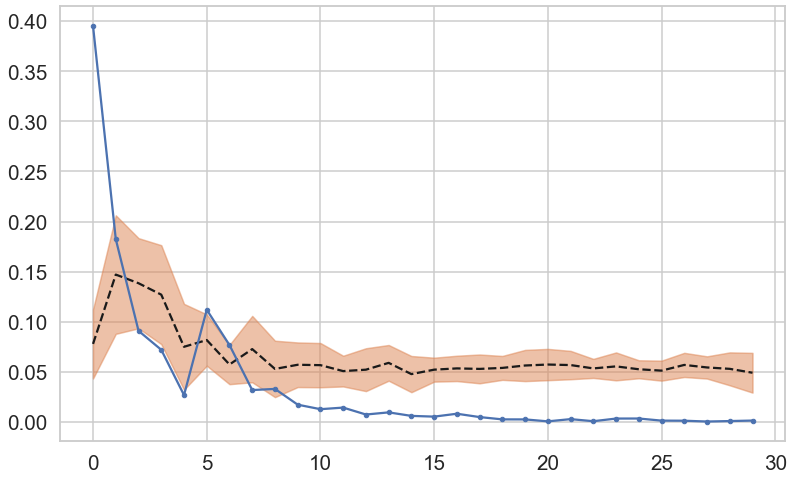

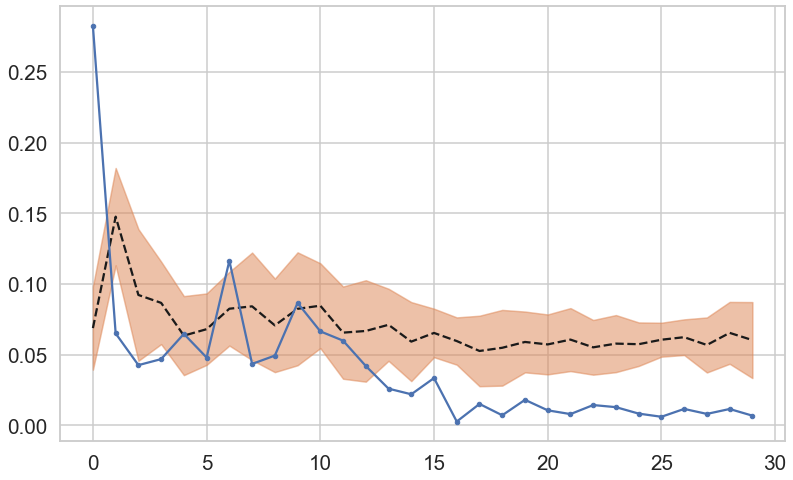

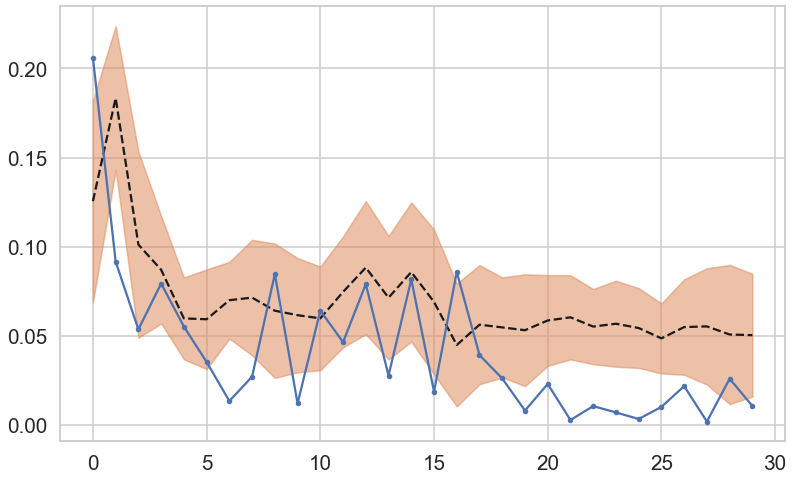

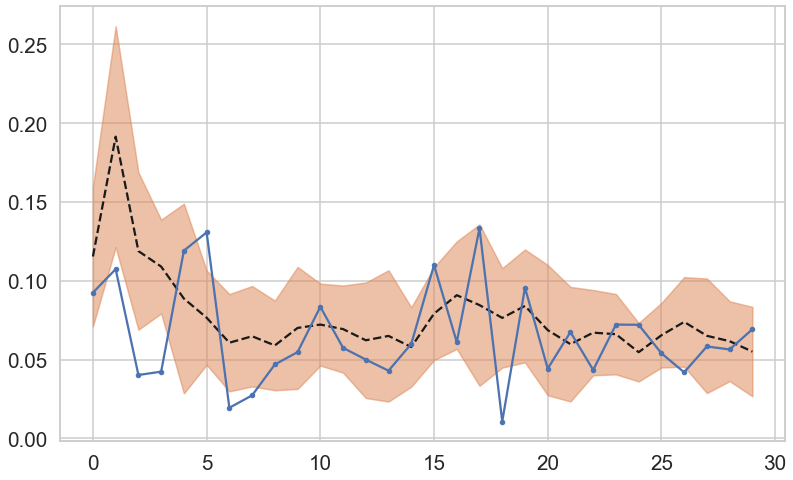

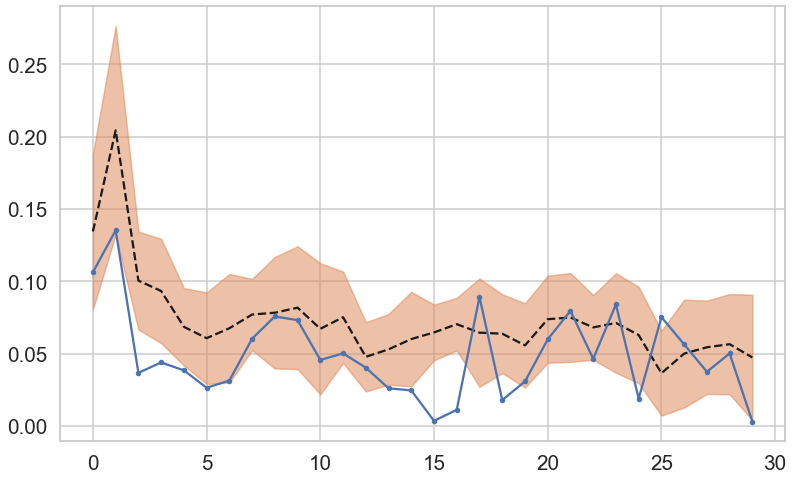

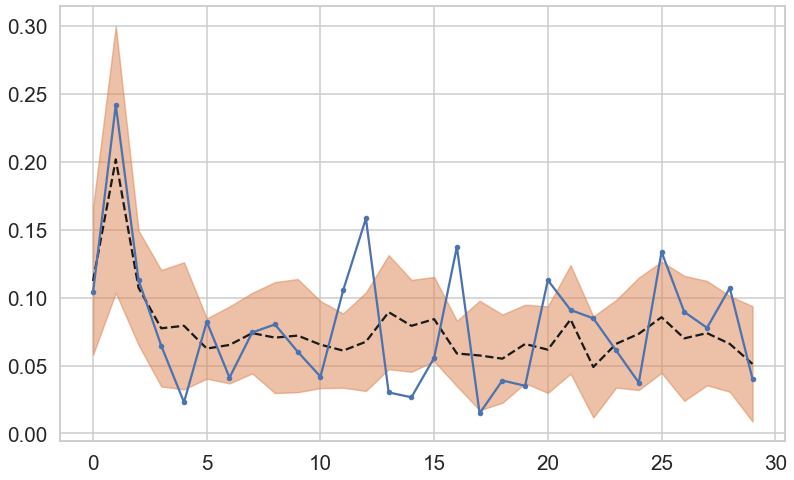

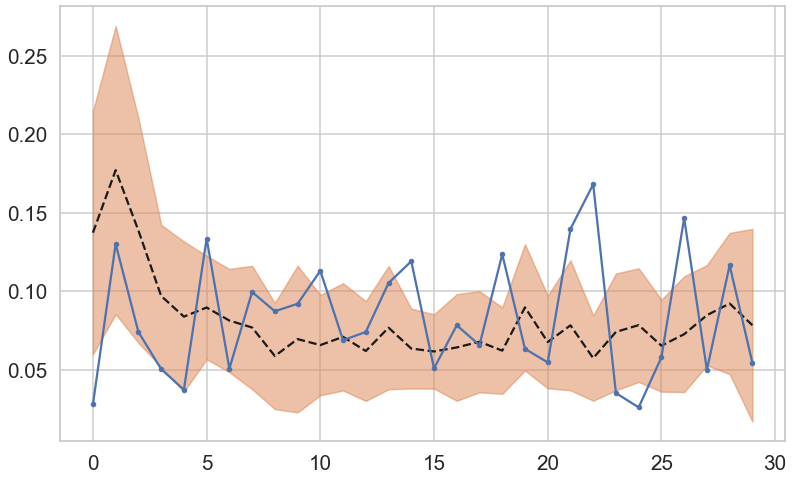

4


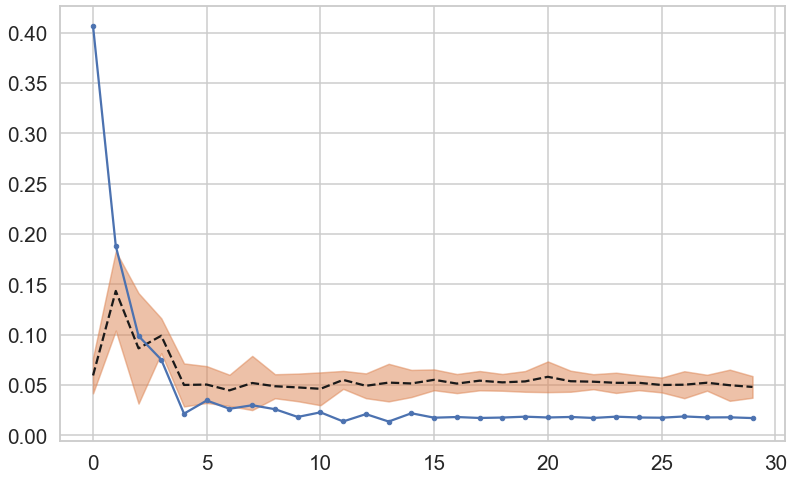

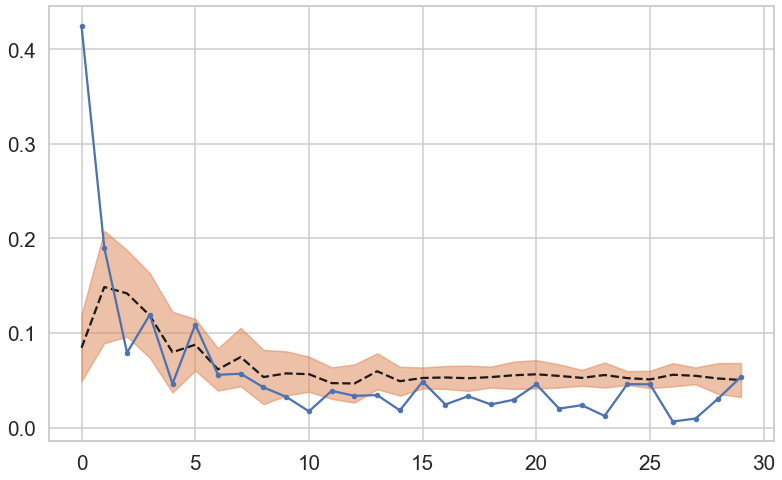

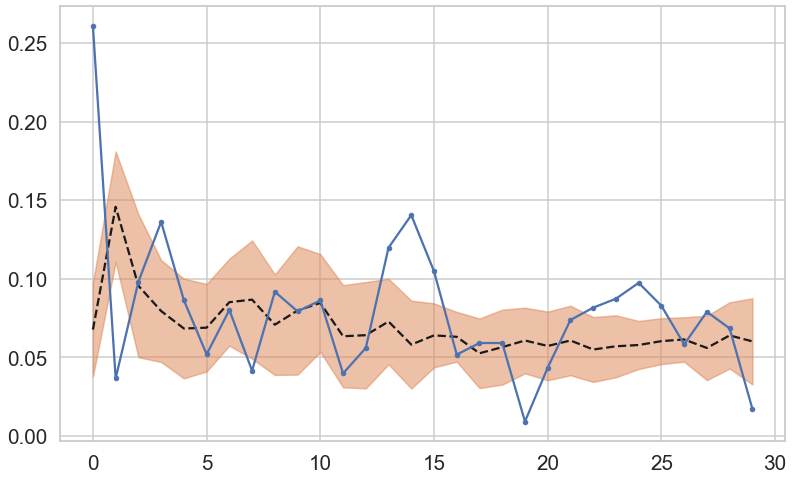

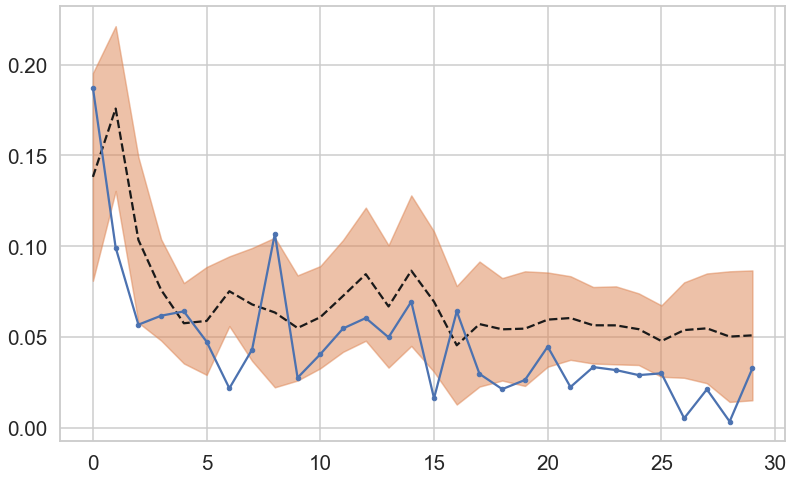

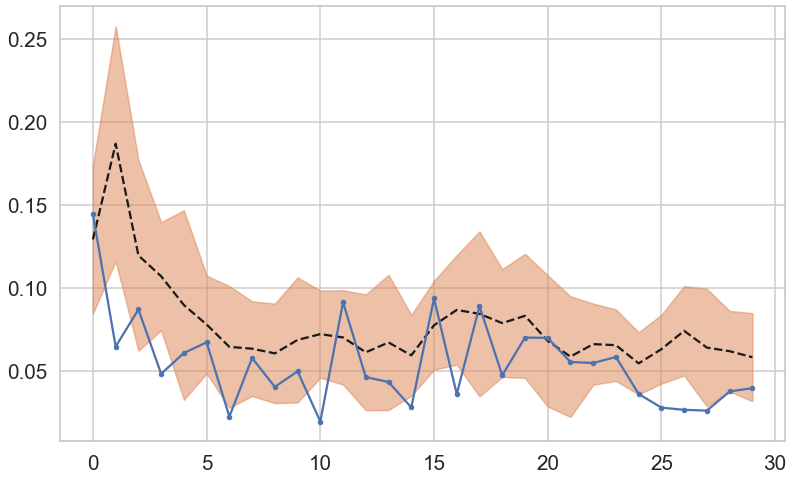

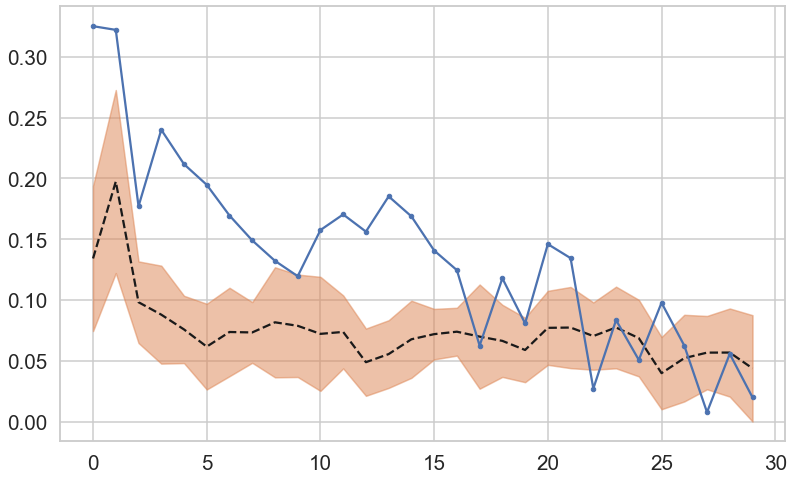

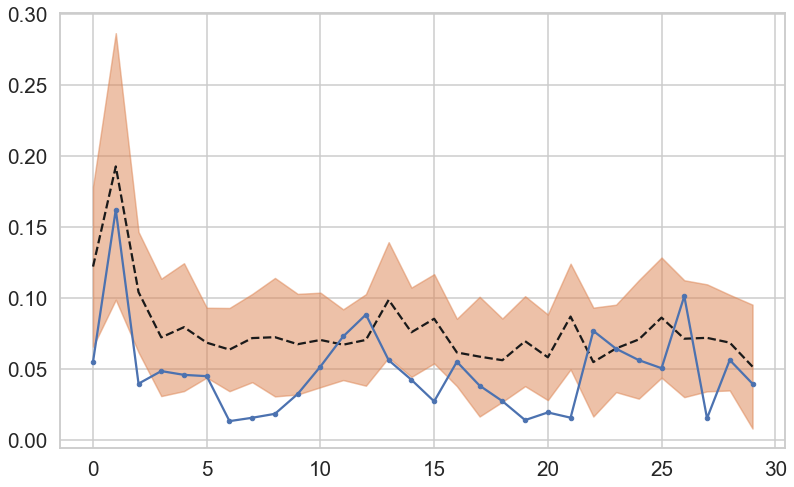

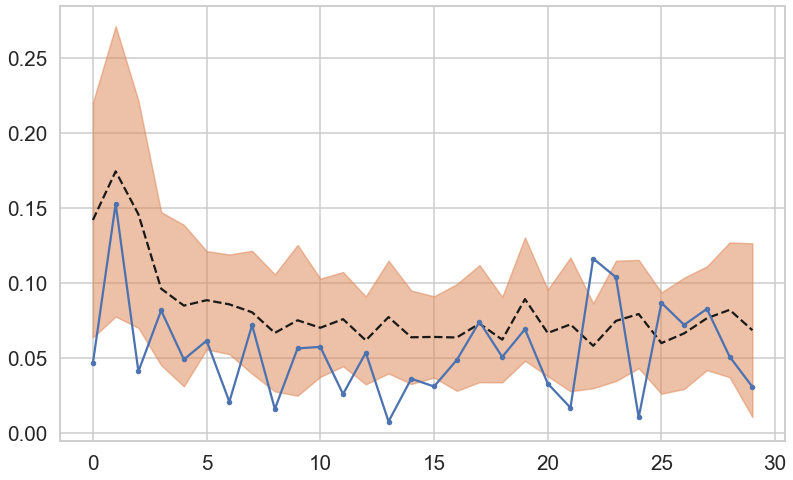

5


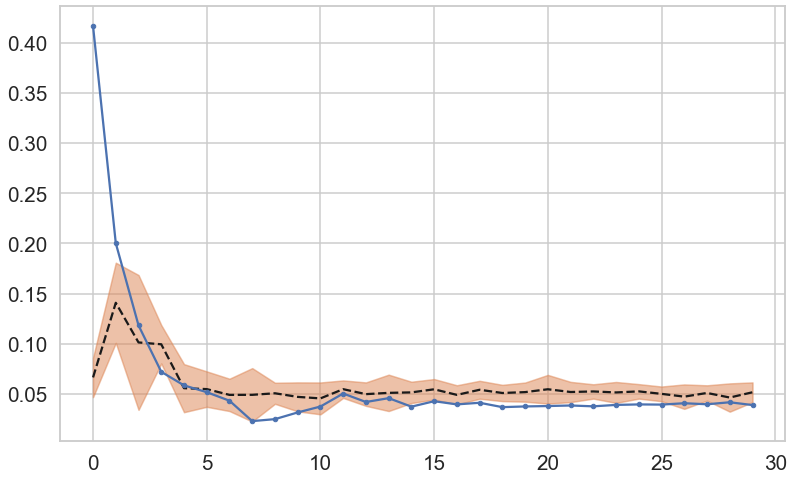

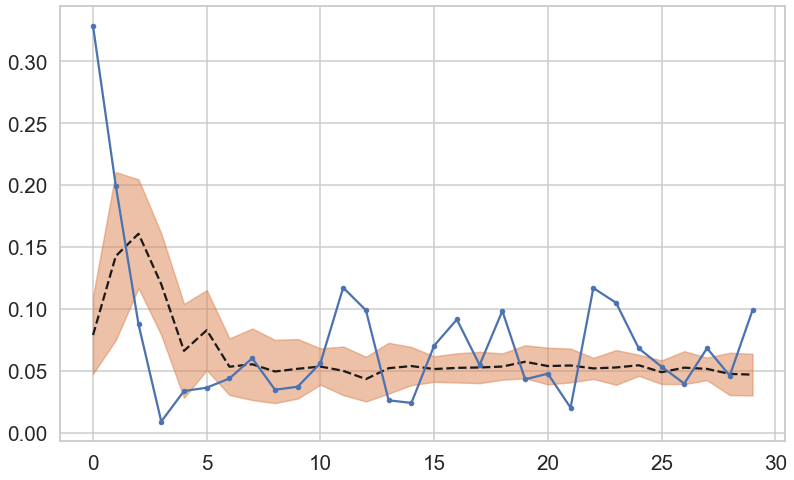

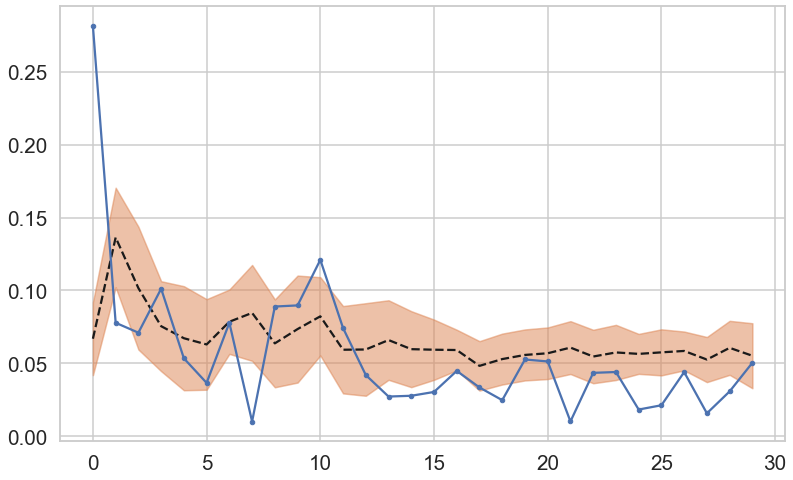

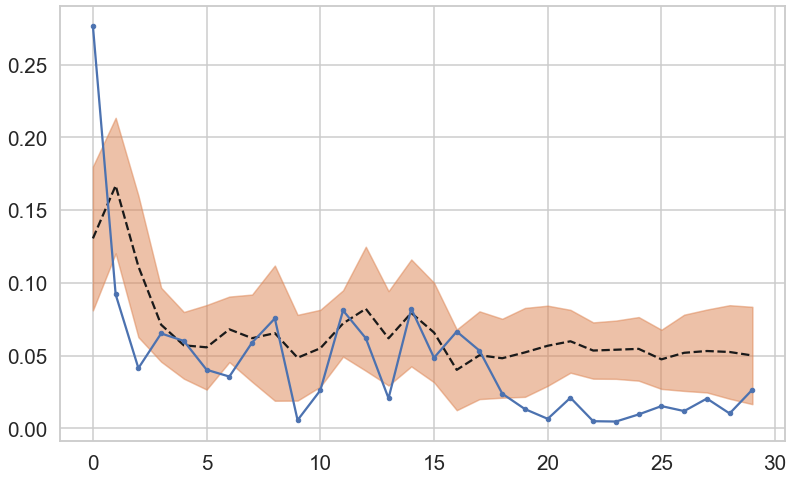

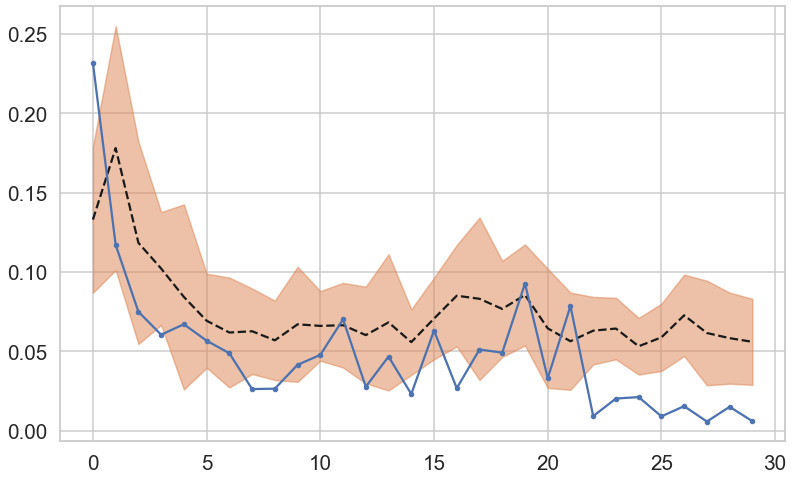

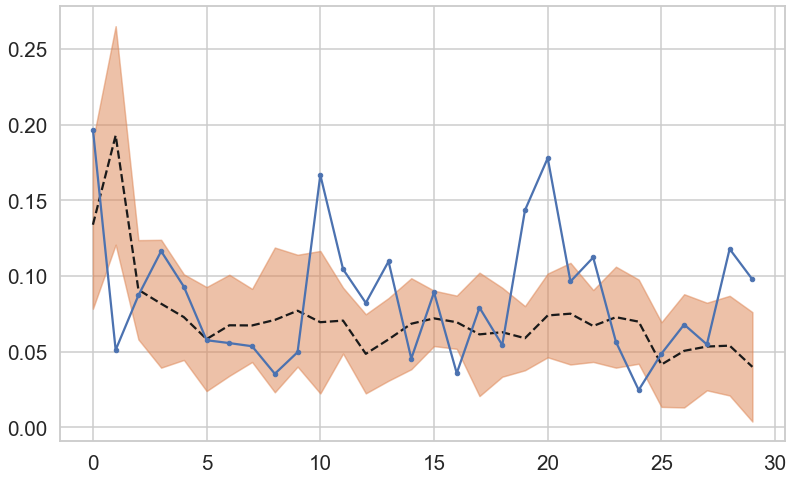

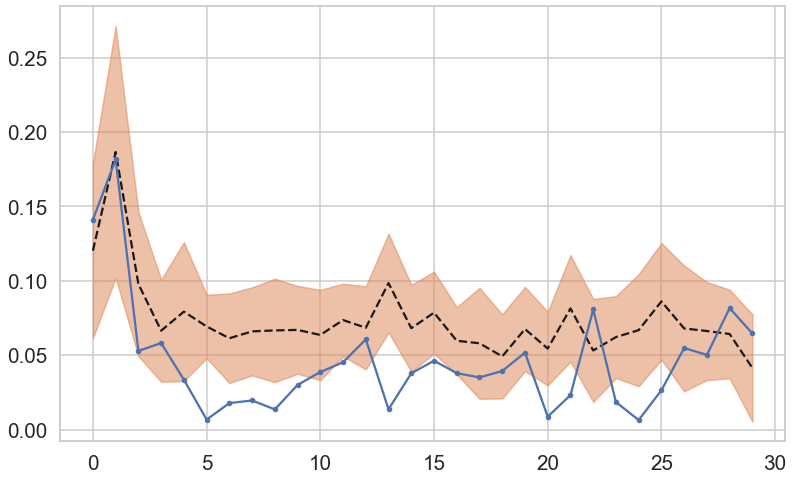

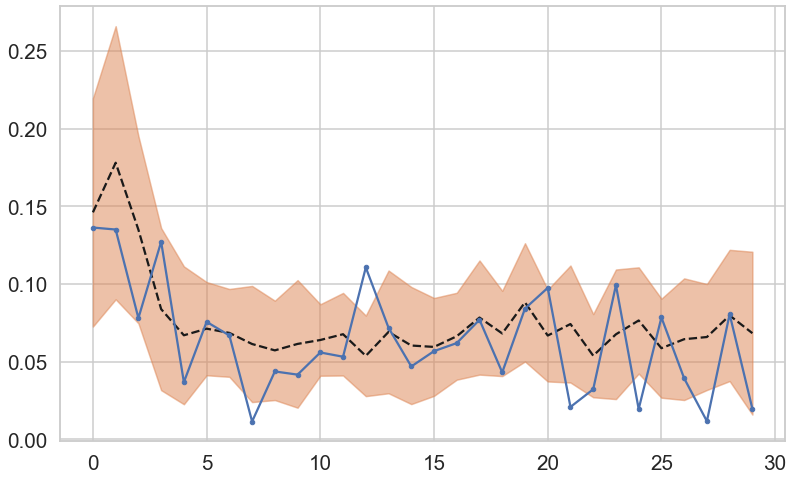

6


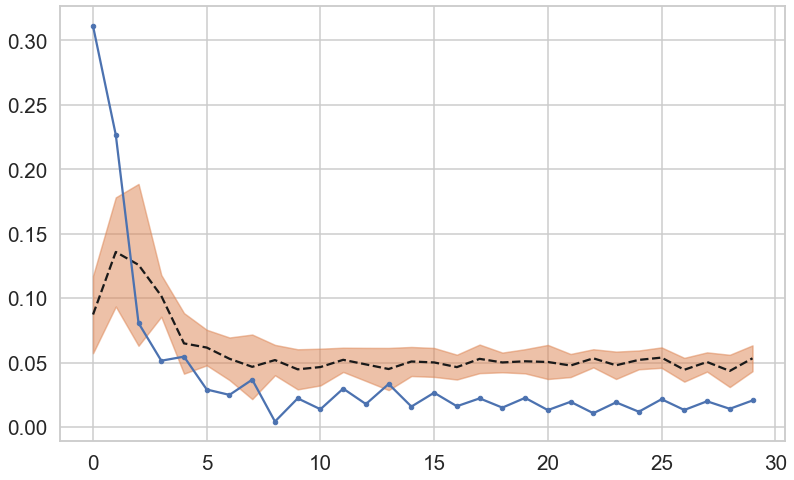

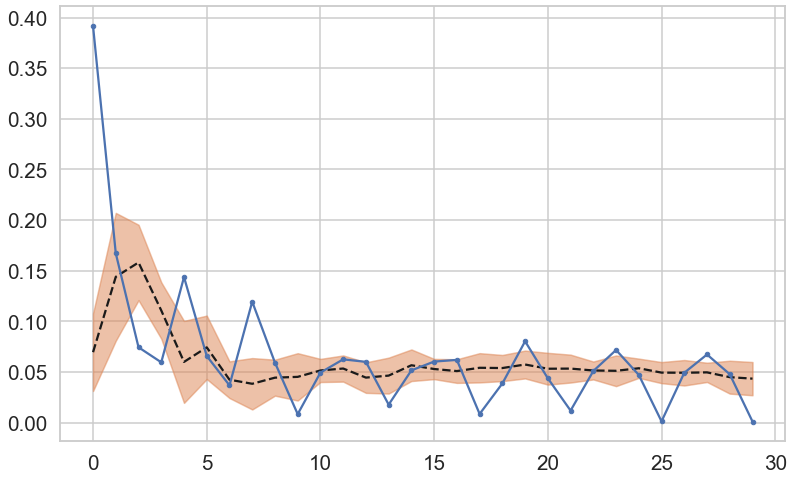

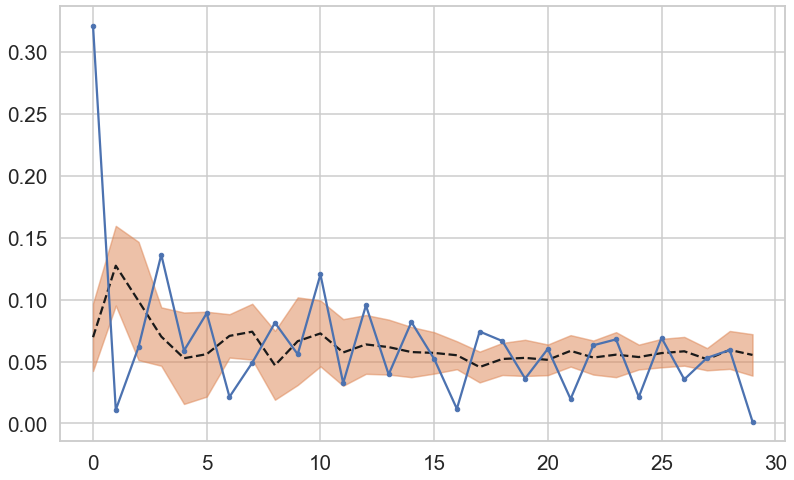

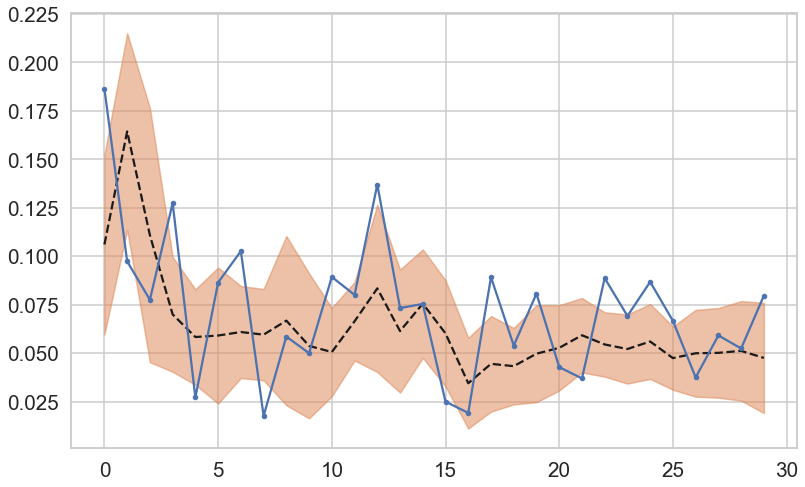

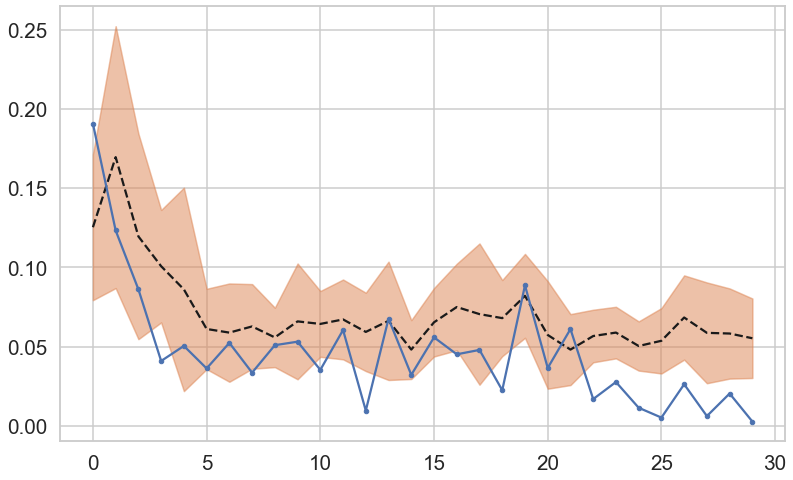

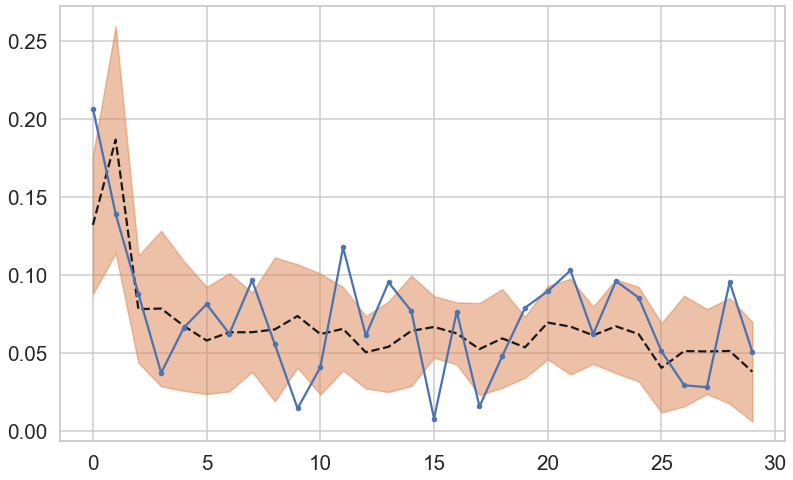

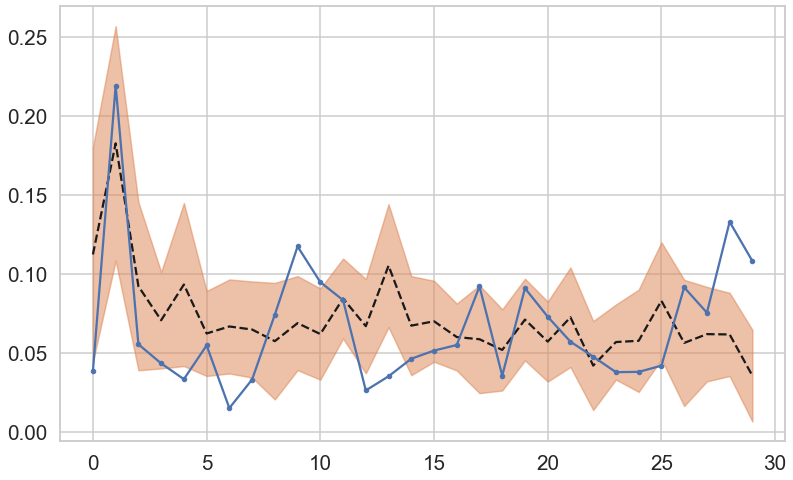

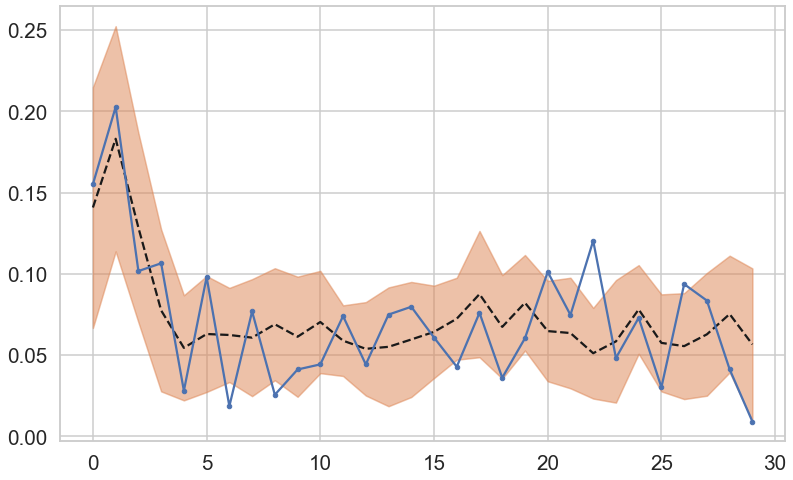

7


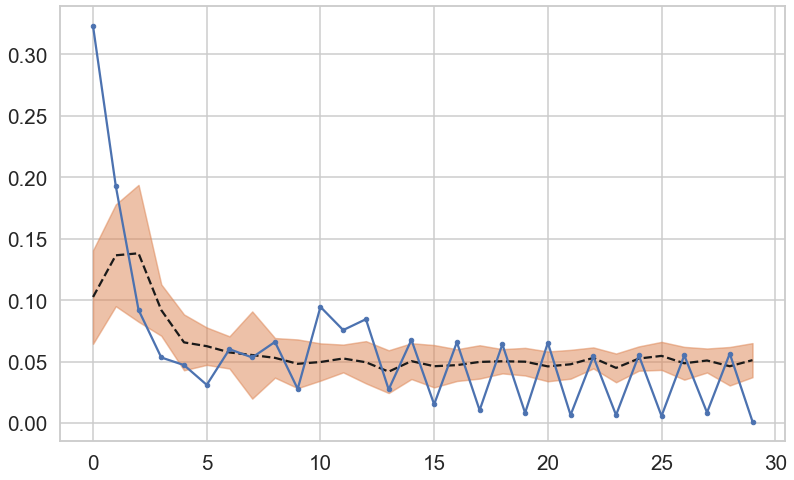

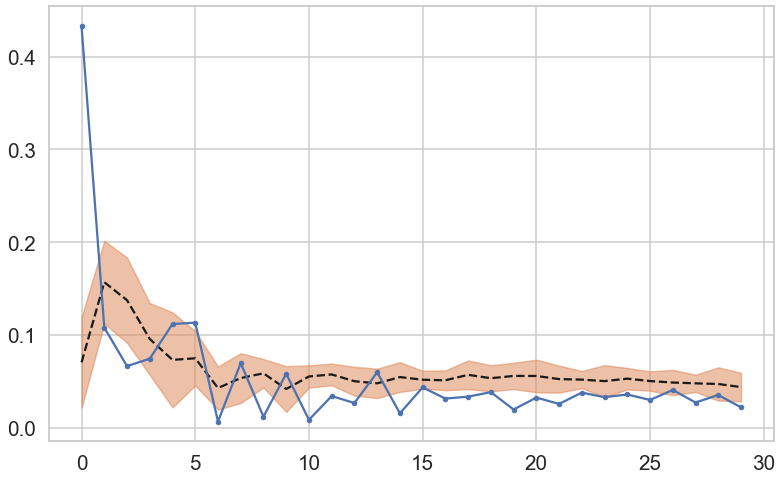

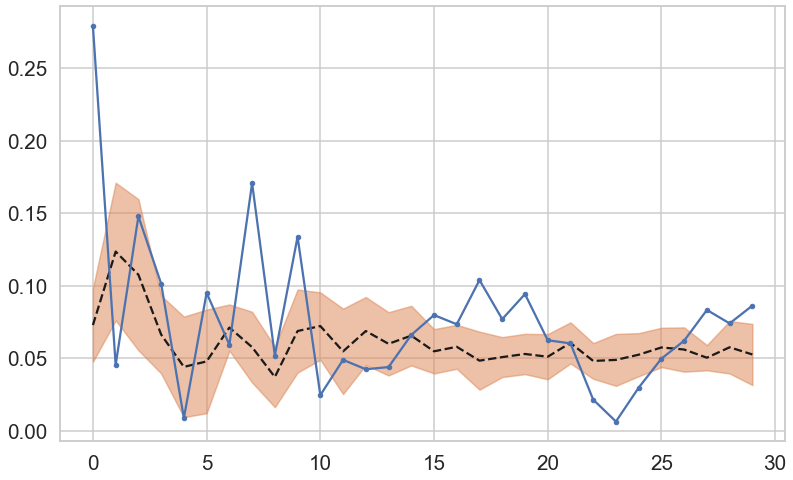

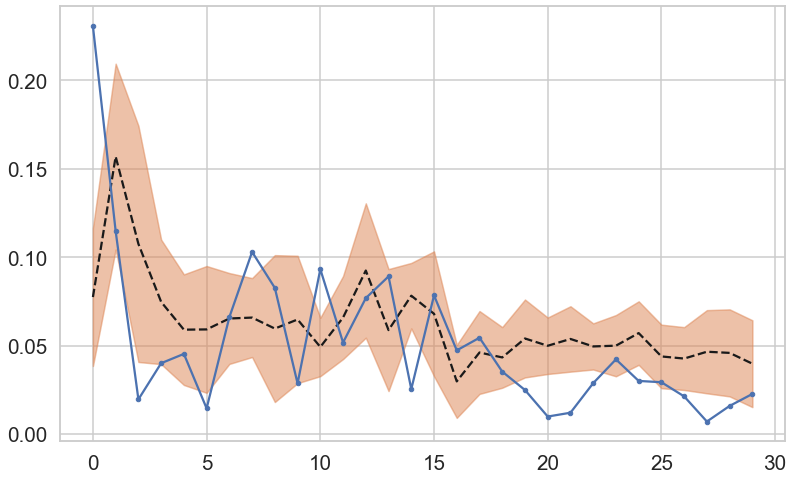

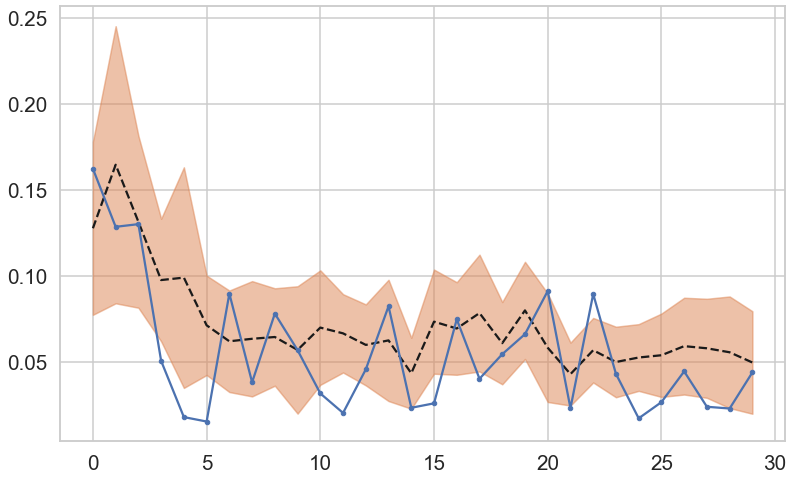

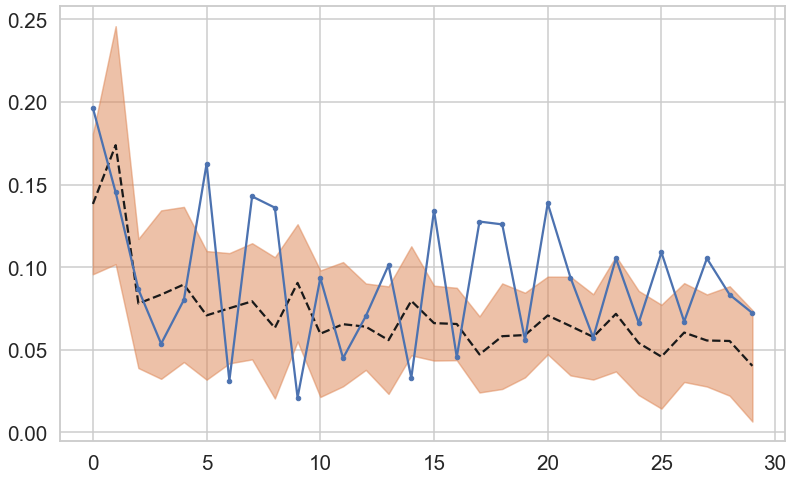

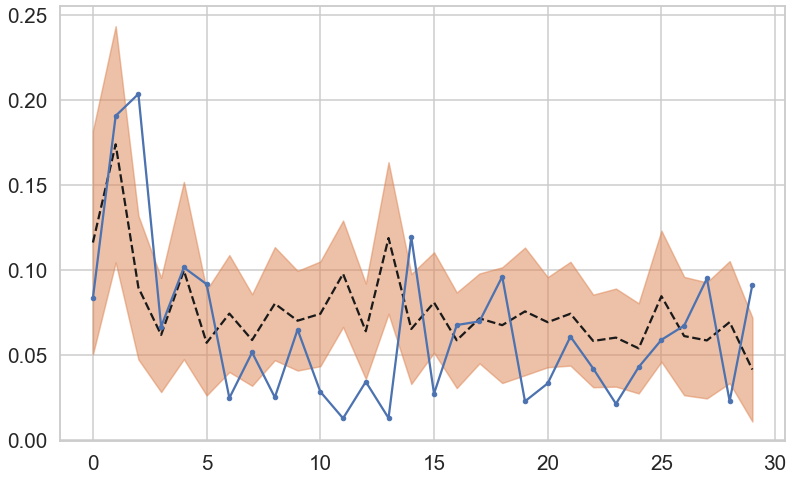

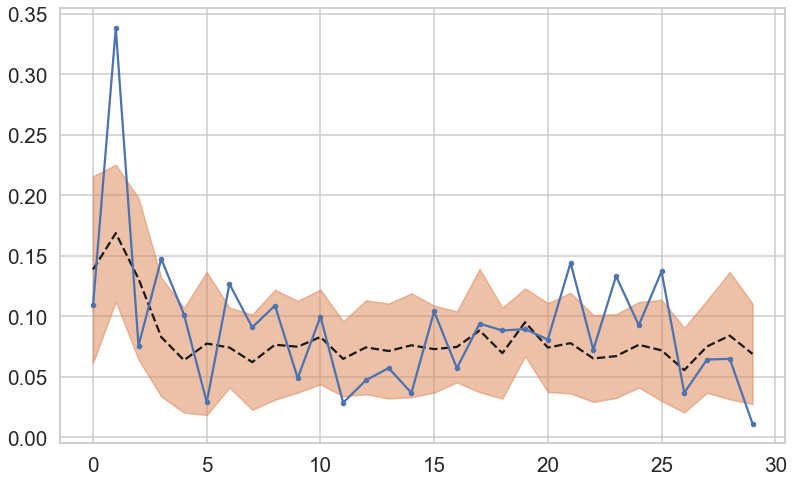

8


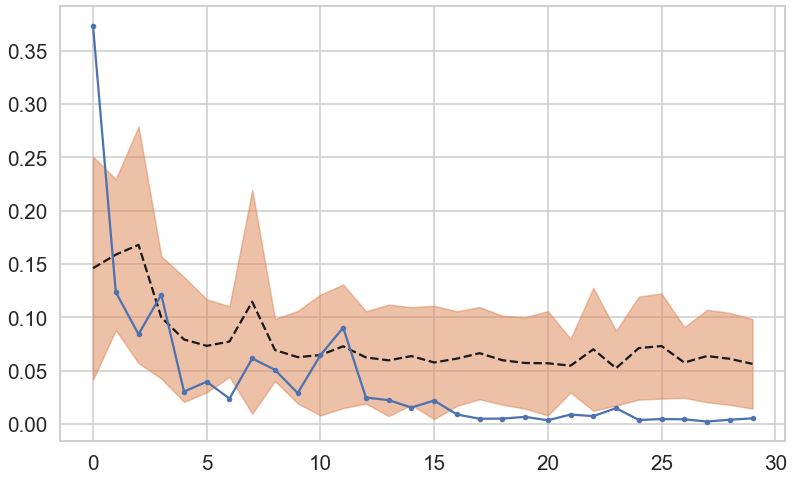

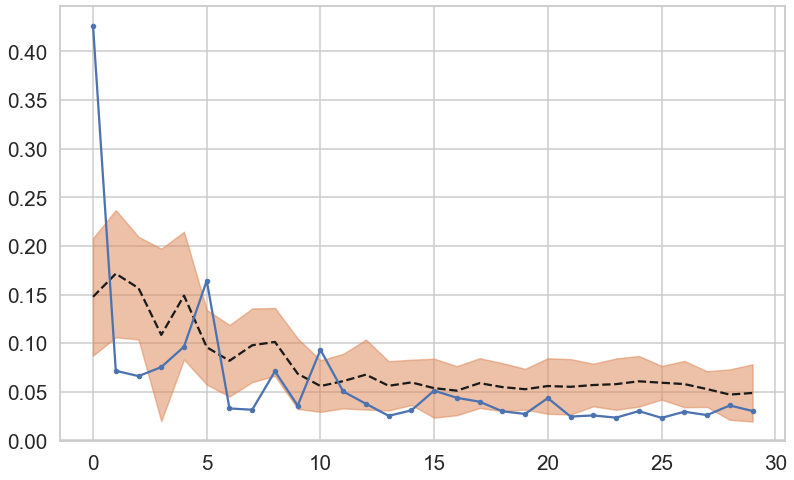

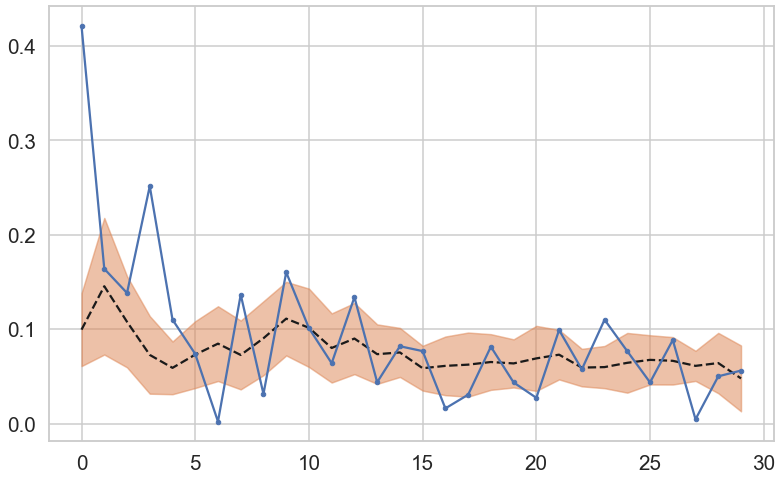

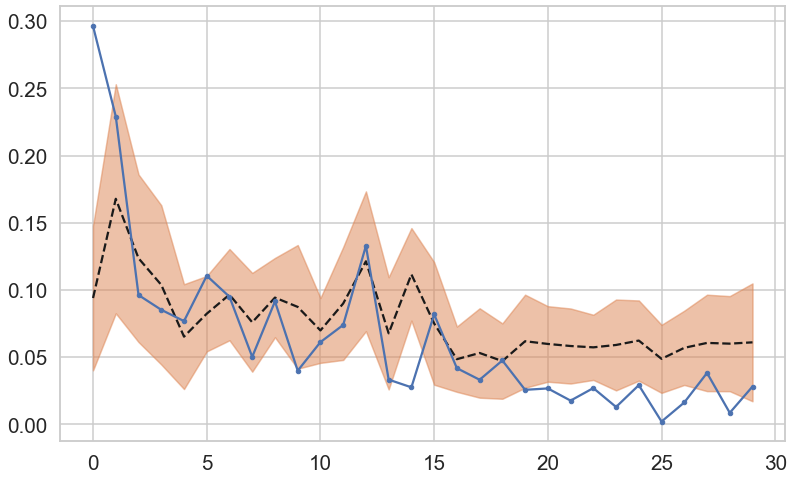

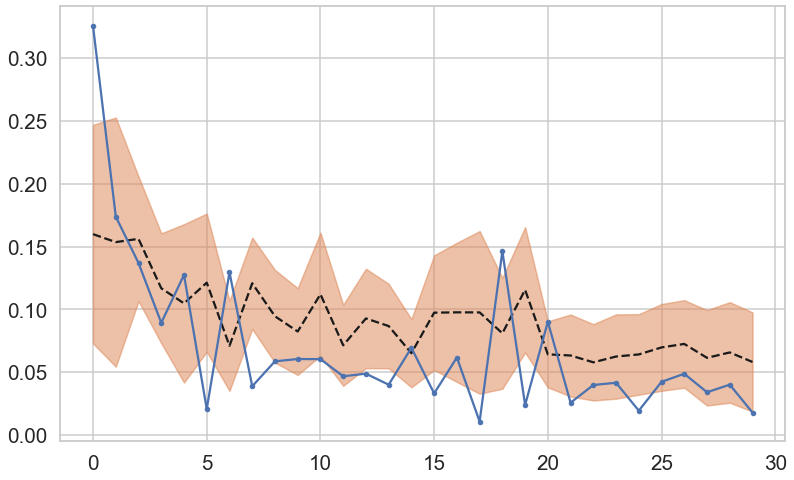

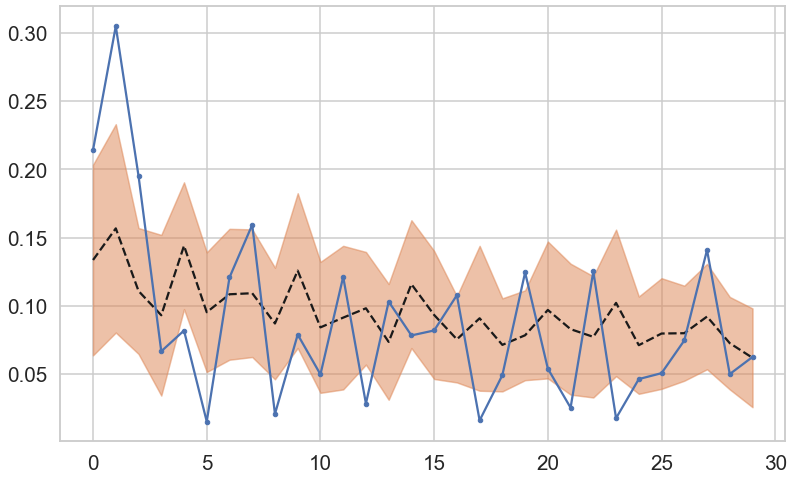

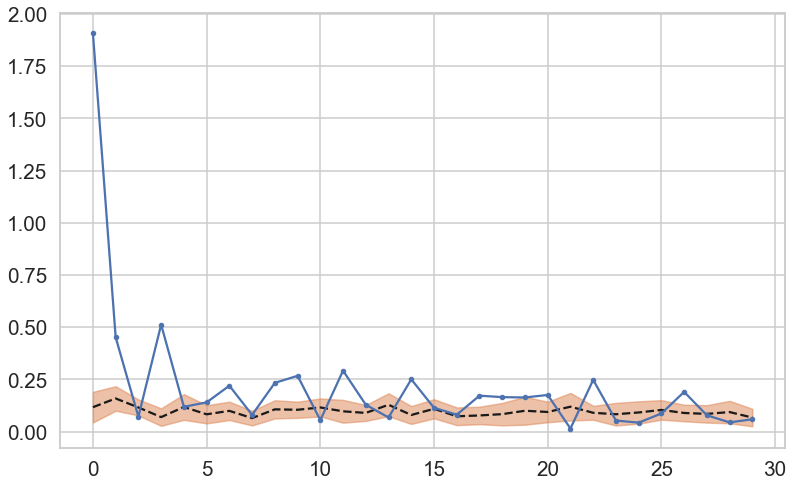

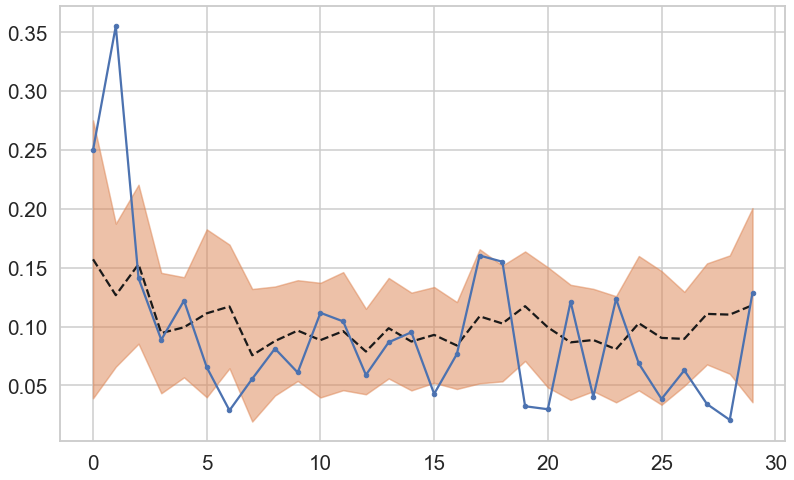

In [89]:
radii_penn = np.arange(10, -40, -5) * 0.001
i_axii_penn = np.arange(3, 9, 1) # 0 to 25 mm
i_axii_jugaad = np.arange(0, 6, 1) # 0 to 25 mm

for m, i_ax_penn in enumerate(i_axii_penn):
    print(i_ax_penn)
    for n, i_rad_penn in enumerate(np.arange(2,10,1)):
        fig = plt.figure(figsize=(13,8))
        ax1 = fig.add_subplot(1,1,1)
        #ax2 = fig.add_subplot(1,2,2)

        i_phase = np.unwrap(phase_data[i_ax_penn, i_rad_penn, :])
        x_position = np.array([radii_penn[i_rad_penn]])
        y_position = np.array([0])
        coordinates = np.array([x_position, y_position]).T

        model_phases = PhaseModel(coordinates)[:, 0]
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_differences = i_phase - model_phases

        #for k in [75]:#np.arange(0, jugaad_phase_differences.shape[2], 1):
        #    ax1.plot(abs(np.fft.rfft(jugaad_phase_differences[m, n, k, :], norm='forward'))[1:], color='b', ls='-', marker='.')
            #ax2.plot(np.arange(0, 360, 6), np.sqrt(np.gradient(jugaad_phase_differences[m, n, k, :])**2), color='b', ls='-', marker='.')
            
        jugaad_mean = abs(np.fft.rfft(jugaad_phase_differences[m,n,:, :],norm='forward',axis=-1)).mean(axis=0)[1:]
        jugaad_var = np.var(abs(np.fft.rfft(jugaad_phase_differences[m,n,:, :],norm='forward',axis=-1)), axis=0)[1:]
        ax1.plot(jugaad_mean, color='k',ls='--', marker='None')
        ax1.fill_between(
            np.arange(0, 30, 1),
            jugaad_mean-np.sqrt(jugaad_var),
            jugaad_mean+np.sqrt(jugaad_var),
            color=clist[1],
            alpha=0.5
        )
        #ax1.plot(jugaad_mean + np.sqrt(jugaad_var), color='k',ls='--', marker='None')
        #ax1.plot(jugaad_mean - np.sqrt(jugaad_var), color='k',ls='--', marker='None')

        ax1.plot(abs(np.fft.rfft(np.flip(phase_differences[np.arange(0, 120, 2)]), norm='forward'))[1:],color='b', marker='.', ls='-')
        #ax2.plot(np.arange(0, 360, 6), np.sqrt(np.gradient(np.flip(phase_differences[np.arange(0, 120, 2)]))**2),color='r', marker='.', ls='-')
        #ax1.set_xlim(0, 29)
    plt.show()
    

# Compare average amplitude of phase error spectrum

In [ ]:
radii_penn = np.arange(10, -40, -5) * 0.001
i_axii_penn = np.arange(3, 9, 1) # 0 to 25 mm
i_axii_jugaad = np.arange(0, 6, 1) # 0 to 25 mm

penn_spectrum_mean_amp = 

for m, i_ax_penn in enumerate(i_axii_penn):
    print(i_ax_penn)
    for n, i_rad_penn in enumerate(np.arange(2,10,1)):
        #fig = plt.figure(figsize=(13,8))
        #ax1 = fig.add_subplot(1,1,1)
        #ax2 = fig.add_subplot(1,2,2)

        i_phase = np.unwrap(phase_data[i_ax_penn, i_rad_penn, :])
        x_position = np.array([radii_penn[i_rad_penn]])
        y_position = np.array([0])
        coordinates = np.array([x_position, y_position]).T

        model_phases = PhaseModel(coordinates)[:, 0]
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_corrections = phase_offset_correction(i_phase, model_phases)
        i_phase += phase_corrections
        phase_differences = i_phase - model_phases
        penn_spectrum = abs(np.fft.rfft(np.flip(phase_differences[np.arange(0, 120, 2)]), norm='forward'))[1:]
        
        

        #for k in [75]:#np.arange(0, jugaad_phase_differences.shape[2], 1):
        #    ax1.plot(abs(np.fft.rfft(jugaad_phase_differences[m, n, k, :], norm='forward'))[1:], color='b', ls='-', marker='.')
            #ax2.plot(np.arange(0, 360, 6), np.sqrt(np.gradient(jugaad_phase_differences[m, n, k, :])**2), color='b', ls='-', marker='.')
            
        jugaad_mean_spectrum = abs(np.fft.rfft(jugaad_phase_differences[m,n,:, :],norm='forward',axis=-1)).mean(axis=0)[1:]
        jugaad_var_spectrum = np.var(abs(np.fft.rfft(jugaad_phase_differences[m,n,:, :],norm='forward',axis=-1)), axis=0)[1:]
        #ax1.plot(jugaad_mean, color='k',ls='--', marker='None')
        #ax1.fill_between(
        #    np.arange(0, 30, 1),
        #    jugaad_mean-np.sqrt(jugaad_var),
        #    jugaad_mean+np.sqrt(jugaad_var),
        #    color=clist[1],
        #    alpha=0.5
        #)
        #ax1.plot(jugaad_mean + np.sqrt(jugaad_var), color='k',ls='--', marker='None')
        #ax1.plot(jugaad_mean - np.sqrt(jugaad_var), color='k',ls='--', marker='None')

        ax1.plot(,color='b', marker='.', ls='-')
        #ax2.plot(np.arange(0, 360, 6), np.sqrt(np.gradient(np.flip(phase_differences[np.arange(0, 120, 2)]))**2),color='r', marker='.', ls='-')
        #ax1.set_xlim(0, 29)
    plt.show()